In [16]:
import rasterio, os
import geopandas as gpd
import numpy as np
from scipy.signal import gaussian
from scipy.ndimage import filters
from glob import glob
import pandas as pd
from osgeo import gdal
from datetime import datetime, timedelta
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
from matplotlib import colors
from mpl_toolkits.axes_grid1 import make_axes_locatable


def sample_point(coord, arr):
    vv = arr[:,coord[0]-2:coord[0]+3, coord[1]-2:coord[1]+3]
    V_med = []
    for i in range(arr.shape[0]):
        V_med.append(np.median(vv[np.logical_not(np.isnan(vv))]))
    
    V_med = np.array(V_med)
    return V_med

# sx, sy = 5, 2

def moving_avg(V_perc, sx, sy):
    V_perc2 = V_perc.copy()
    N, P = V_perc.shape
    for i in range(P):
        V_perc2[:,i] = np.mean(V_perc2[:,i:min(i+sx, P)], 1)
    
    for i in range(N):
        V_perc2[i] = np.median(V_perc[i:min(i+sy, N)], 0)
    
    return V_perc2


# def create_series(Vh_perc2):
#     Vh_avg = []
#     for i in range(Vh_perc2.shape[0]):
#         Vh_avg.append(np.median(Vh_perc2[i][np.logical_not(np.isnan(Vh_perc2[i]))]))
    
#     Vh_avg = np.array(Vh_avg)
#     return Vh_avg


def create_series(Vh_perc2):
    Vh_avg = []
    Vh_25tile = []
    Vh_75tile = []
    for i in range(Vh_perc2.shape[0]):
        Vh_avg.append(np.median(Vh_perc2[i][np.logical_not(np.isnan(Vh_perc2[i]))]))
        Vh_25tile.append(np.percentile(Vh_perc2[i][np.logical_not(np.isnan(Vh_perc2[i]))], 25))
        Vh_75tile.append(np.percentile(Vh_perc2[i][np.logical_not(np.isnan(Vh_perc2[i]))], 75))
    
    Vh_avg = np.array(Vh_avg)
    Vh_25tile = np.array(Vh_25tile)
    Vh_75tile = np.array(Vh_75tile)
    return Vh_avg, Vh_25tile, Vh_75tile


def create_cross_sect(Vh_perc2):
    Vh_avg = []
    Vh_25tile = []
    Vh_75tile = []
    for i in range(Vh_perc2.shape[1]):
        if np.logical_not(np.isnan(Vh_perc2[:,i])).sum()==0:
            # print('ERROR: No valid value')
            Vh_avg.append(np.nan)
            Vh_25tile.append(np.nan)
            Vh_75tile.append(np.nan)
        else:  
            Vh_avg.append(np.median(Vh_perc2[:,i][np.logical_not(np.isnan(Vh_perc2[:,i]))]))
            Vh_25tile.append(np.percentile(Vh_perc2[:,i][np.logical_not(np.isnan(Vh_perc2[:,i]))], 25))
            Vh_75tile.append(np.percentile(Vh_perc2[:,i][np.logical_not(np.isnan(Vh_perc2[:,i]))], 75))
    
    Vh_avg = np.array(Vh_avg)
    Vh_25tile = np.array(Vh_25tile)
    Vh_75tile = np.array(Vh_75tile)
    return Vh_avg, Vh_25tile, Vh_75tile


def create_cross_sect2(Vh_perc2):
    Vh_avg = []
    Vh_25tile = []
    Vh_75tile = []
    n = len(Vh_perc2[:,0])
    for i in range(Vh_perc2.shape[1]):
        if np.logical_not(np.isnan(Vh_perc2[:,i])).sum()<n:
            # print('ERROR: No valid value')
            Vh_avg.append(np.nan)
            Vh_25tile.append(np.nan)
            Vh_75tile.append(np.nan)
        else:  
            Vh_avg.append(np.median(Vh_perc2[:,i][np.logical_not(np.isnan(Vh_perc2[:,i]))]))
            Vh_25tile.append(np.percentile(Vh_perc2[:,i][np.logical_not(np.isnan(Vh_perc2[:,i]))], 25))
            Vh_75tile.append(np.percentile(Vh_perc2[:,i][np.logical_not(np.isnan(Vh_perc2[:,i]))], 75))
    
    Vh_avg = np.array(Vh_avg)
    Vh_25tile = np.array(Vh_25tile)
    Vh_75tile = np.array(Vh_75tile)
    return Vh_avg, Vh_25tile, Vh_75tile


# def remove_duplitcate(V_mavg, Vh_mavg):
#     prev = -10000
#     cnt = 0
#     cnts = []
#     V_mavg2 = V_mavg.copy()
#     Vh_mavg2 = Vh_mavg.copy()
#     for i in range(len(V_mavg)):
#         # print(V_mavg[i])
#         if V_mavg[i]==prev:
#             cnt+=1
#         else:
#             cnts.append(cnt)
#             if cnt>1:
#                 # print(cnt, V_mavg2[i-cnt:i], i, i-(cnt//2))
#                 V_mavg2[i-cnt:i] = np.nan
#                 V_mavg2[i-(cnt//2)-1] = V_mavg[i-1]
#                 Vh_mavg2[i-cnt:i] = np.nan
#                 Vh_mavg2[i-(cnt//2)-1] = Vh_mavg[i-1]
                
#             # print("dfd")
#             prev = V_mavg[i]
#             cnt=1

#     return V_mavg2, Vh_mavg2

def remove_duplitcate(V_mavg):
    prev = -10000
    cnt = 0
    cnts = []
    V_mavg2 = V_mavg.copy()
    for i in range(len(V_mavg)):
        if V_mavg[i]==prev:
            cnt+=1
        else:
            cnts.append(cnt)
            if cnt>1:
                # print(cnt, V_mavg2[i-cnt:i], i, i-(cnt//2))
                V_mavg2[i-cnt:i] = np.nan
                V_mavg2[i-(cnt//2)-1] = V_mavg[i-1]
                
            prev = V_mavg[i]
            cnt=1

    return V_mavg2

In [35]:
vel_files = glob('/DATA/run_*/3D_Velocities_orig/*.tif')
# vel_files = glob('/DATA/run_*/3D_Velocities/*.tif')

vel_files_sing, start_dt = {}, []
for fl in vel_files:
    dt_m, dt_s, p1, p2 = fl.split('/')[-1][:-4].split('_')
    if int(p2)-int(p1)==1:
        start_dt.append(dt_m)
        vel_files_sing[dt_m] = fl #([dt_m, dt_s, fl])

# vel_files_sing = np.array(sorted(vel_files_sing))
start_dt = sorted(start_dt)

date_m = [f'{str(dt)[:4]}/{str(dt)[4:6]}/{str(dt)[6:]}' for dt in start_dt]
date_dt = [datetime.strptime(dt, '%Y/%m/%d').date() for dt in date_m]
month = ['', 'Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept', 'Oct', 'Nov', 'Dec']
date_ml = [f'{month[int(dt[5:7])]} {dt[:4]}' for dt in date_m]
N = len(date_m)

In [36]:
rasters = '/DATA/3D_velocities_SBAS/'

stack = f'{rasters}/stack_{5}_{6}.tif'
# date_m = [f'{str(dt)[:4]}/{str(dt)[4:6]}/{str(dt)[6:]}' for dt in df['Master'][0:73]]
# x = [datetime.strptime(dt, '%Y/%m/%d').date() for dt in date_m]

src = rasterio.open(stack)
src_dem = rasterio.open('/DATA/dem_crop.tif')

lines_fl = ['line1_point.shp', 'line4_point.shp', 'line4_2_point.shp', 'line5_point.shp', 'line3_point.shp', 'line3_point2.shp']

coords_list = []
dem_list = []
for line in lines_fl:
    pts = gpd.read_file(f'/DATA/sample_glaciers/{line}')
    pts = pts['geometry'].to_crs(32643)
    # pts.index = range(len(pts))
    if 'line5' in line:
        coords = [(pts[i].x, pts[i].y) for i in range(len(pts))][::-1]
    else:
        coords = [(pts[i].x, pts[i].y) for i in range(len(pts))]
    coords_list.append(coords)

    coords_img = [list(src.index(coord[0], coord[1])) for coord in coords]
    dem = np.array([x for x in src_dem.sample(coords)])
    dem_list.append(dem)

In [37]:
# rasters = '/DATA/corrected_stack3'
# rasters = '/DATA/correctedSBAS'
# rasters = '/DATA/3D_velocities_upd/'
# rasters = '/DATA/run_2017_19/3D_Velocities/'

V_all_list, V_list, Vh_list = [], [], []
V_perc_list, Vh_perc_list = [], []
for i in range(len(coords_list)):
    coords = coords_list[i]
    V_all = []
    date_prox = []
    for i in range(len(date_m)-1):
        deltaT = (date_dt[i+1]-date_dt[i]).days if (i<N-1) else -1
        stack = vel_files_sing[start_dt[i]] 
        # f'{rasters}/stack_{i}_{i+1}.tif'
        # print(stack)
        src = rasterio.open(stack)
        src_arr = src.read()
        # v = np.array([sample_point(coordi, src_arr) for coordi in coords_img])
        v = np.array([x for x in src.sample(coords)])
        date_prox.append(date_dt[i])
        V_all.append(v)
        
        if deltaT>12:
            print(date_dt[i], deltaT)
            for it in range(12, deltaT, 12):
                stack = vel_files_sing[start_dt[i]]
                src = rasterio.open(stack)
                src_arr = src.read()
                # v = np.array([sample_point(coordi, src_arr) for coordi in coords_img])
                v = np.array([x for x in src.sample(coords)])
                date_prox.append(date_dt[i]+timedelta(days=it))
                V_all.append(v)
                
    V_all = np.array(V_all)
    V = np.sqrt(V_all[:,:,0]**2 + V_all[:,:,1]**2) 
    # Vh = np.abs(V_all[:,:,2])
    Vh = -V_all[:,:,2]

    V_avg = np.array([np.mean(v[np.logical_not(np.isnan(v))]) for v in V.T]).reshape(1, -1)
    Vh_avg = np.array([np.mean(v[np.logical_not(np.isnan(v))]) for v in Vh.T]).reshape(1, -1)
    
    V_perc = ((V - V_avg)/V_avg)*100
    Vh_perc = ((Vh - Vh_avg)/Vh_avg)*100

    # print(V_all.shape)
    V_all_list.append(V_all)
    V_list.append(V)
    Vh_list.append(Vh)
    V_perc_list.append(V_perc)
    Vh_perc_list.append(Vh_perc)

date_ml = [f'{month[dt.month]} {str(dt.year)}' for dt in sorted(date_prox)]  # Req

date_plot, date_idx = [], []
id = 0
check = ['Dec', 'Apr', 'Aug']
while (id<len(date_ml)):
    dt = date_ml[id]
    dt_month = dt.split(' ')[0]
    if dt_month not in check:
        id+=1
        continue

    i1 = id
    while dt_month in date_ml[id]:
        id+=1

    date_idx.append((id+i1)//2)
    date_plot.append(date_ml[(id+i1)//2])

# src_avg = rasterio.open('/home/dbalaji/Ayush/Avg_velocity_prev2.tif')
# v_avg = np.array([x for x in src_avg.sample(coords)])
# V_avg = np.sqrt(v_avg[:,0]**2 + v_avg[:,1]**2).reshape(1, -1)
# Vh_avg = np.abs(v_avg[:,2]).reshape(1, -1)



2017-04-13 24
2017-06-24 36
2017-09-28 24
2017-11-03 24
2017-12-09 24
2018-03-03 36
2018-12-16 24
2019-02-02 24
2019-03-22 36
2019-04-27 36
2019-06-02 72
2019-10-12 24
2020-03-04 24
2020-04-21 60
2017-04-13 24
2017-06-24 36
2017-09-28 24
2017-11-03 24
2017-12-09 24
2018-03-03 36
2018-12-16 24
2019-02-02 24
2019-03-22 36
2019-04-27 36
2019-06-02 72
2019-10-12 24
2020-03-04 24
2020-04-21 60


/home/dbalaji/anaconda3/envs/isce2/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/dbalaji/anaconda3/envs/isce2/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


2017-04-13 24
2017-06-24 36
2017-09-28 24
2017-11-03 24
2017-12-09 24
2018-03-03 36
2018-12-16 24
2019-02-02 24
2019-03-22 36
2019-04-27 36
2019-06-02 72
2019-10-12 24
2020-03-04 24
2020-04-21 60
2017-04-13 24
2017-06-24 36
2017-09-28 24
2017-11-03 24
2017-12-09 24
2018-03-03 36
2018-12-16 24
2019-02-02 24
2019-03-22 36
2019-04-27 36
2019-06-02 72
2019-10-12 24
2020-03-04 24
2020-04-21 60
2017-04-13 24
2017-06-24 36
2017-09-28 24
2017-11-03 24
2017-12-09 24
2018-03-03 36
2018-12-16 24
2019-02-02 24
2019-03-22 36
2019-04-27 36
2019-06-02 72
2019-10-12 24
2020-03-04 24
2020-04-21 60
2017-04-13 24
2017-06-24 36
2017-09-28 24
2017-11-03 24
2017-12-09 24
2018-03-03 36
2018-12-16 24
2019-02-02 24
2019-03-22 36
2019-04-27 36
2019-06-02 72
2019-10-12 24
2020-03-04 24
2020-04-21 60


In [6]:
def generate_data_Vplot(V):
    V_mavg, V_m25tile, V_m75tile = create_series(V)
    V_mavg2 = remove_duplitcate(V_mavg)
    b = gaussian(6, 1.5)
    V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
    return V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga

In [199]:
((dem.min()//500)+1)*500

4500

In [ ]:
V2 = moving_avg(V, 5, 2)
Vh2 = moving_avg(Vh, 5, 2)

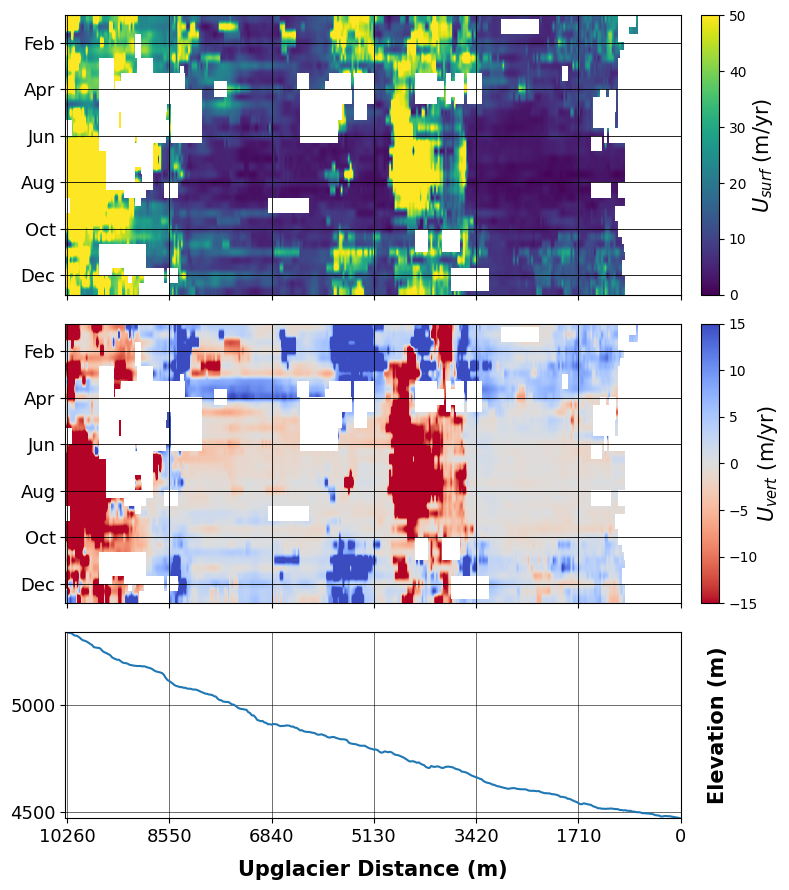

In [23]:
gl_no = 2

V_month_avg = []
Vh_month_avg = []
mnth_idx = []
for mn in range(1, 13):
    for i in range(3):
        store = []
        storeh = []
        V_perc_l = moving_avg(V_list[gl_no], 5, 1)
        Vh_perc_l = moving_avg(Vh_list[gl_no], 5, 1)
        
        for j, dt in enumerate(date_prox):
            if (mn==dt.month)&(i==(dt.day//11)):
                # store.append(V_perc_list[gl_no][j])
                # storeh.append(Vh_perc_list[gl_no][j])
                store.append(V_perc_l[j])
                storeh.append(Vh_perc_l[j])

        v_avg, _, _ = create_cross_sect2(np.array(store))
        vh_avg, _, _ = create_cross_sect2(np.array(storeh))
        V_month_avg.append(v_avg)
        Vh_month_avg.append(vh_avg)
        mnth_idx.append(month[mn])

V_month_avg = np.array(V_month_avg)
Vh_month_avg = np.array(Vh_month_avg)

fig, ax = plt.subplots(3, figsize=(8, 9), gridspec_kw={'height_ratios': [1.5, 1.5, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V_month_avg.shape[1], 0, V_month_avg.shape[0]]
V[np.isnan(V)] = 0
im = ax[0].imshow(V_month_avg[:], vmin=0, vmax=50, cmap='viridis', aspect='auto')
ax[0].set_xlim(V_month_avg.shape[1], 0)
ax[0].set_xticks(range(0, V_month_avg.shape[1], V_month_avg.shape[1]//6), [])
ax[0].set_yticks(range(3, len(mnth_idx), 6), mnth_idx[3::6], fontsize=13)
ax[0].xaxis.set_tick_params(labelsize=11)
ax[0].grid(linewidth=0.6, color='black')
ax[0].tick_params(direction='out', grid_alpha=1)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ticks=np.linspace(0, 50, 6, endpoint=True), ax=ax[0], cax=cax)
cbar.set_label('$U_{surf}$ (m/yr)', fontsize=15, labelpad=3.5)

extent = [0, Vh_month_avg.shape[1], 0, Vh_month_avg.shape[0]]
# V[np.isnan(V)] = 0
im = ax[1].imshow(Vh_month_avg[:], vmin=-15, vmax=15, cmap='coolwarm_r', aspect='auto')
ax[1].set_xlim(V_month_avg.shape[1], 0)
ax[1].set_xticks(range(0, Vh_month_avg.shape[1], Vh_month_avg.shape[1]//6), [])
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[1].set_yticks(range(3, len(mnth_idx), 6), mnth_idx[3::6], fontsize=13)
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].grid(linewidth=0.6, color='black')
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[1], cax=cax)
cbar.set_label('$U_{vert}$ (m/yr)', fontsize=15, labelpad=-1.5)


dem = dem_list[gl_no]
ax[2].plot(dem)
ax[2].set_xlim(V_month_avg.shape[1], 0)
ax[2].set_ylim(dem.min(), dem.max())
plt_xidx = [int(dis) for dis in range(0, Vh_month_avg.shape[1]*30, (Vh_month_avg.shape[1]//6)*30)]
ax[2].set_yticks(np.arange(((dem.min()//250)+1)*250, dem.max(), 500), np.arange(((dem.min()//250)+1)*250, dem.max(), 500), fontsize=11)
ax[2].set_xticks(range(0, Vh_month_avg.shape[1], Vh_month_avg.shape[1]//6), plt_xidx)
ax[2].xaxis.set_tick_params(labelsize=13)
ax[2].yaxis.set_tick_params(labelsize=13)
ax[2].grid(linewidth=0.4, color='black')
ax[2].set_ylabel("Elevation (m)", fontweight='bold', fontsize=15, labelpad=20)
ax[2].set_xlabel("Upglacier Distance (m)", fontweight='bold', fontsize=15, labelpad=10)
divider2 = make_axes_locatable(ax[2])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
ax[2].yaxis.set_label_position("right")
# ax[2].yaxis.tick_right()
plt.tight_layout()
# plt.show()
plt.savefig('/DATA/Plots/bara_shigri_mntrend.png')
plt.show()

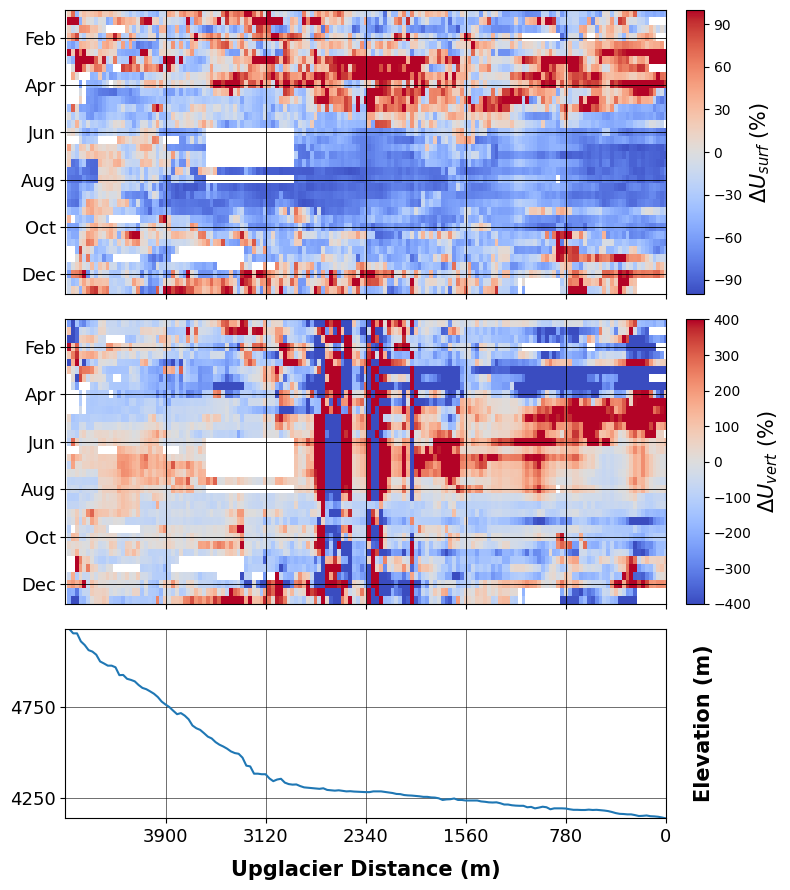

In [51]:
gl_no = 3

V_month_avg = []
Vh_month_avg = []
mnth_idx = []
for mn in range(1, 13):
    for i in range(3):
        store = []
        storeh = []
        V_perc_l = moving_avg(V_perc_list[gl_no], 5, 1)
        Vh_perc_l = moving_avg(Vh_perc_list[gl_no], 5, 1)
        
        for j, dt in enumerate(date_prox):
            if (mn==dt.month)&(i==(dt.day//11)):
                # store.append(V_perc_list[gl_no][j])
                # storeh.append(Vh_perc_list[gl_no][j])
                store.append(V_perc_l[j])
                storeh.append(Vh_perc_l[j])

        v_avg, _, _ = create_cross_sect2(np.array(store))
        vh_avg, _, _ = create_cross_sect2(np.array(storeh))
        V_month_avg.append(v_avg)
        Vh_month_avg.append(vh_avg)
        mnth_idx.append(month[mn])

V_month_avg = np.array(V_month_avg)
Vh_month_avg = np.array(Vh_month_avg)

fig, ax = plt.subplots(3, figsize=(8, 9), gridspec_kw={'height_ratios': [1.5, 1.5, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V_month_avg.shape[1], 0, V_month_avg.shape[0]]
V[np.isnan(V)] = 0
im = ax[0].imshow(V_month_avg[:], vmin=-100, vmax=100, cmap='coolwarm', aspect='auto')
ax[0].set_xlim(V_month_avg.shape[1], 0)
ax[0].set_xticks(range(0, V_month_avg.shape[1], V_month_avg.shape[1]//6), [])
ax[0].set_yticks(range(3, len(mnth_idx), 6), mnth_idx[3::6], fontsize=13)
ax[0].xaxis.set_tick_params(labelsize=11)
ax[0].grid(linewidth=0.6, color='black')
ax[0].tick_params(direction='out', grid_alpha=1)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ticks=np.linspace(-90, 90, 7, endpoint=True), ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{surf}$ (%)', fontsize=15)

extent = [0, Vh_month_avg.shape[1], 0, Vh_month_avg.shape[0]]
# V[np.isnan(V)] = 0
im = ax[1].imshow(Vh_month_avg[:], vmin=-400, vmax=400, cmap='coolwarm', aspect='auto')
ax[1].set_xlim(V_month_avg.shape[1], 0)
ax[1].set_xticks(range(0, Vh_month_avg.shape[1], Vh_month_avg.shape[1]//6), [])
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[1].set_yticks(range(3, len(mnth_idx), 6), mnth_idx[3::6], fontsize=13)
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].grid(linewidth=0.6, color='black')
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[1], cax=cax)
cbar.set_label('$ΔU_{vert}$ (%)', fontsize=15, labelpad=3.5)


dem = dem_list[gl_no]
ax[2].plot(dem)
ax[2].set_xlim(V_month_avg.shape[1], 0)
ax[2].set_ylim(dem.min(), dem.max())
plt_xidx = [int(dis) for dis in range(0, Vh_month_avg.shape[1]*30, (Vh_month_avg.shape[1]//6)*30)]
ax[2].set_yticks(np.arange(((dem.min()//250)+1)*250, dem.max(), 500), np.arange(((dem.min()//250)+1)*250, dem.max(), 500), fontsize=11)
ax[2].set_xticks(range(0, Vh_month_avg.shape[1], Vh_month_avg.shape[1]//6), plt_xidx)
ax[2].xaxis.set_tick_params(labelsize=13)
ax[2].yaxis.set_tick_params(labelsize=13)
ax[2].grid(linewidth=0.4, color='black')
ax[2].set_ylabel("Elevation (m)", fontweight='bold', fontsize=15, labelpad=20)
ax[2].set_xlabel("Upglacier Distance (m)", fontweight='bold', fontsize=15, labelpad=10)
divider2 = make_axes_locatable(ax[2])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
ax[2].yaxis.set_label_position("right")
# ax[2].yaxis.tick_right()
plt.tight_layout()
# plt.show()
plt.savefig('/DATA/Plots/bara_shigri_mntrend.png')
plt.show()

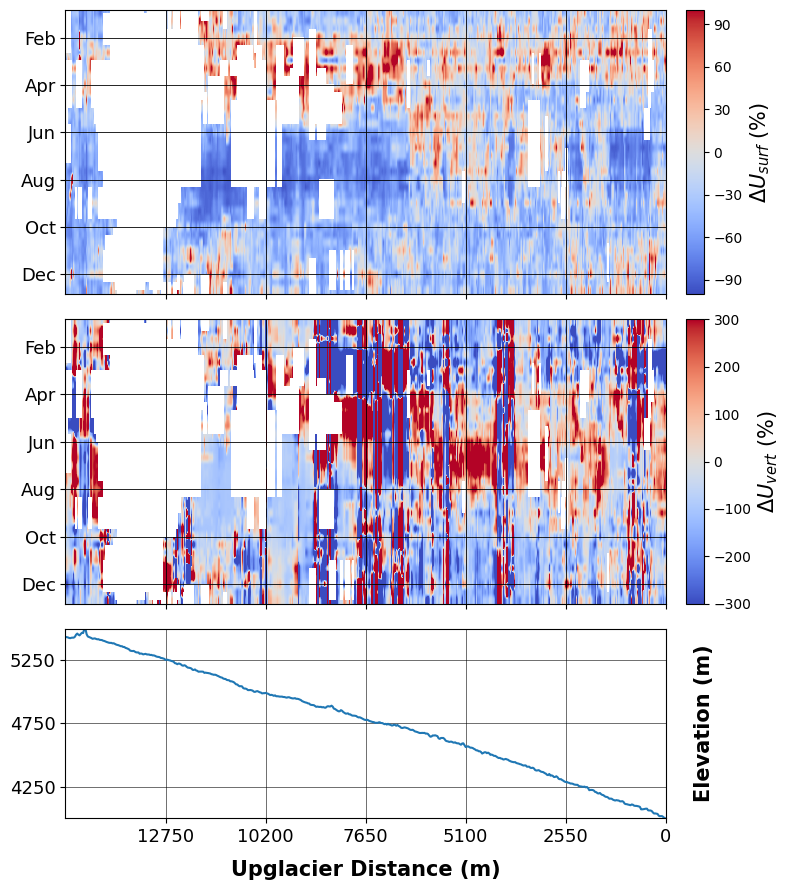

In [50]:
gl_no = 0

V_month_avg = []
Vh_month_avg = []
mnth_idx = []
for mn in range(1, 13):
    for i in range(3):
        store = []
        storeh = []
        V_perc_l = moving_avg(V_perc_list[gl_no], 10, 3)
        Vh_perc_l = moving_avg(Vh_perc_list[gl_no], 10, 3)
        
        for j, dt in enumerate(date_prox):
            if (mn==dt.month)&(i==(dt.day//11)):
                # store.append(V_perc_list[gl_no][j])
                # storeh.append(Vh_perc_list[gl_no][j])
                store.append(V_perc_l[j])
                storeh.append(Vh_perc_l[j])

        v_avg, _, _ = create_cross_sect2(np.array(store))
        vh_avg, _, _ = create_cross_sect2(np.array(storeh))
        V_month_avg.append(v_avg)
        Vh_month_avg.append(vh_avg)
        mnth_idx.append(month[mn])

V_month_avg = np.array(V_month_avg)
Vh_month_avg = np.array(Vh_month_avg)

fig, ax = plt.subplots(3, figsize=(8, 9), gridspec_kw={'height_ratios': [1.5, 1.5, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V_month_avg.shape[1], 0, V_month_avg.shape[0]]
V[np.isnan(V)] = 0
im = ax[0].imshow(V_month_avg[:], vmin=-100, vmax=100, cmap='coolwarm', aspect='auto')
ax[0].set_xlim(V_month_avg.shape[1], 0)
ax[0].set_xticks(range(0, V_month_avg.shape[1], V_month_avg.shape[1]//6), [])
ax[0].set_yticks(range(3, len(mnth_idx), 6), mnth_idx[3::6], fontsize=13)
ax[0].xaxis.set_tick_params(labelsize=11)
ax[0].grid(linewidth=0.6, color='black')
ax[0].tick_params(direction='out', grid_alpha=1)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ticks=np.linspace(-90, 90, 7, endpoint=True), ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{surf}$ (%)', fontsize=15)

extent = [0, Vh_month_avg.shape[1], 0, Vh_month_avg.shape[0]]
# V[np.isnan(V)] = 0
im = ax[1].imshow(Vh_month_avg[:], vmin=-300, vmax=300, cmap='coolwarm', aspect='auto')
ax[1].set_xlim(V_month_avg.shape[1], 0)
ax[1].set_xticks(range(0, Vh_month_avg.shape[1], Vh_month_avg.shape[1]//6), [])
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[1].set_yticks(range(3, len(mnth_idx), 6), mnth_idx[3::6], fontsize=13)
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].grid(linewidth=0.6, color='black')
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[1], cax=cax)
cbar.set_label('$ΔU_{vert}$ (%)', fontsize=15, labelpad=3.5)


dem = dem_list[gl_no]
ax[2].plot(dem)
ax[2].set_xlim(V_month_avg.shape[1], 0)
ax[2].set_ylim(dem.min(), dem.max())
plt_xidx = [int(dis) for dis in range(0, Vh_month_avg.shape[1]*30, (Vh_month_avg.shape[1]//6)*30)]
ax[2].set_yticks(np.arange(((dem.min()//250)+1)*250, dem.max(), 500), np.arange(((dem.min()//250)+1)*250, dem.max(), 500), fontsize=11)
ax[2].set_xticks(range(0, Vh_month_avg.shape[1], Vh_month_avg.shape[1]//6), plt_xidx)
ax[2].xaxis.set_tick_params(labelsize=13)
ax[2].yaxis.set_tick_params(labelsize=13)
ax[2].grid(linewidth=0.4, color='black')
ax[2].set_ylabel("Elevation (m)", fontweight='bold', fontsize=15, labelpad=20)
ax[2].set_xlabel("Upglacier Distance (m)", fontweight='bold', fontsize=15, labelpad=10)
divider2 = make_axes_locatable(ax[2])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
ax[2].yaxis.set_label_position("right")
# ax[2].yaxis.tick_right()
plt.tight_layout()
# plt.show()
plt.savefig('/DATA/Plots/bara_shigri_mntrend.png')
plt.show()

In [10]:
winter = ['Sept', 'Oct', 'Dec', 'Jan', 'Feb']
summer = ['Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug']
# winter = ['Sept', 'Oct', 'Dec', 'Jun', 'Jul', 'Aug']
# summer = ['Jan', 'Feb', 'Mar', 'Apr', 'May']

winter_idx = np.array([i for i, dt in enumerate(date_ml) if dt.split(' ')[0] in winter])
summer_idx = np.array([i for i, dt in enumerate(date_ml) if dt.split(' ')[0] in summer])
# date_ml[0].split(' ')
# winter_idx

/tmp/ipykernel_249906/3132534835.py:10: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_249906/3132534835.py:11: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_s_ga = filters.convolve1d(V_mavg_s, b / b.sum(), mode="reflect")
/tmp/ipykernel_249906/3132534835.py:13: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_249906/3132534835.py:14: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_s_ga = filters.convolve1d(Vh_mavg_s, b / b.sum(), mode="reflect")


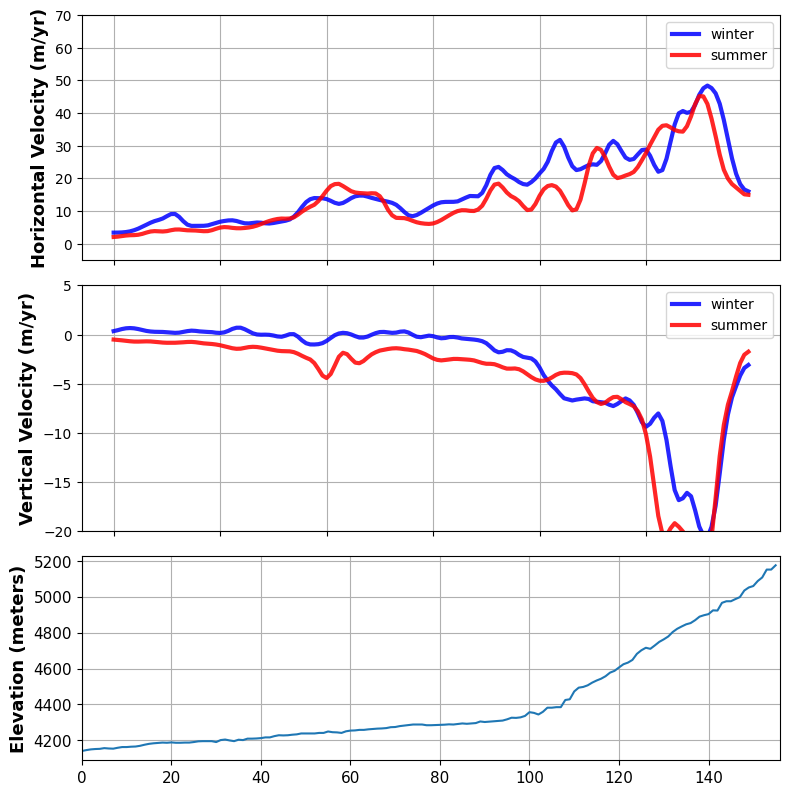

In [15]:
gl = 3
dem = dem_list[gl]
V_mavg, V_m25tile, V_m75tile = create_cross_sect(V_list[gl][winter_idx,:])
V_mavg_s, V_m25tile_s, V_m75tile_s = create_cross_sect(V_list[gl][summer_idx,:])

Vh_mavg, Vh_m25tile, Vh_m75tile = create_cross_sect(Vh_list[gl][winter_idx,:])
Vh_mavg_s, Vh_m25tile_s, Vh_m75tile_s = create_cross_sect(Vh_list[gl][summer_idx,:])

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
V_mavg_s_ga = filters.convolve1d(V_mavg_s, b / b.sum(), mode="reflect")

Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")
Vh_mavg_s_ga = filters.convolve1d(Vh_mavg_s, b / b.sum(), mode="reflect")


fig, ax = plt.subplots(3, figsize=(8, 8), gridspec_kw={'height_ratios': [1.2, 1.2, 1]})

ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='blue', label='winter', linewidth=3, alpha=0.85)
ax[0].plot(range(len(V_mavg)), V_mavg_s_ga, '-', color='red', label='summer', linewidth=3, alpha=0.85)
ax[0].set_xticks(range(0, V_mavg.shape[0], V_mavg.shape[0]//6), [])
ax[0].set_ylabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=13)
# ax[0].set_ylim(-5, 70)
ax[0].set_ylim(-5, 70)
ax[0].grid()
ax[0].legend()

ax[1].plot(range(len(Vh_mavg)), Vh_mavg_ga, '-', color='blue', label='winter', linewidth=3, alpha=0.85)
ax[1].plot(range(len(Vh_mavg)), Vh_mavg_s_ga, '-', color='red', label='summer', linewidth=3, alpha=0.85)
ax[1].set_xticks(range(0, Vh_mavg.shape[0], Vh_mavg.shape[0]//6), [])
ax[1].set_ylabel("Vertical Velocity (m/yr)", fontweight='bold', fontsize=13)
# ax[1].set_ylim(-1, 40)
ax[1].set_ylim(-20, 5)
ax[1].grid()
ax[1].legend()

ax[2].plot(dem)
ax[2].set_xlim(0, dem.shape[0])
ax[2].xaxis.set_tick_params(labelsize=11)
ax[2].yaxis.set_tick_params(labelsize=11)
ax[2].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
ax[2].grid()

plt.tight_layout()
plt.show()

/tmp/ipykernel_224867/2352951275.py:7: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_224867/2352951275.py:8: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_s_ga = filters.convolve1d(V_mavg_s, b / b.sum(), mode="reflect")


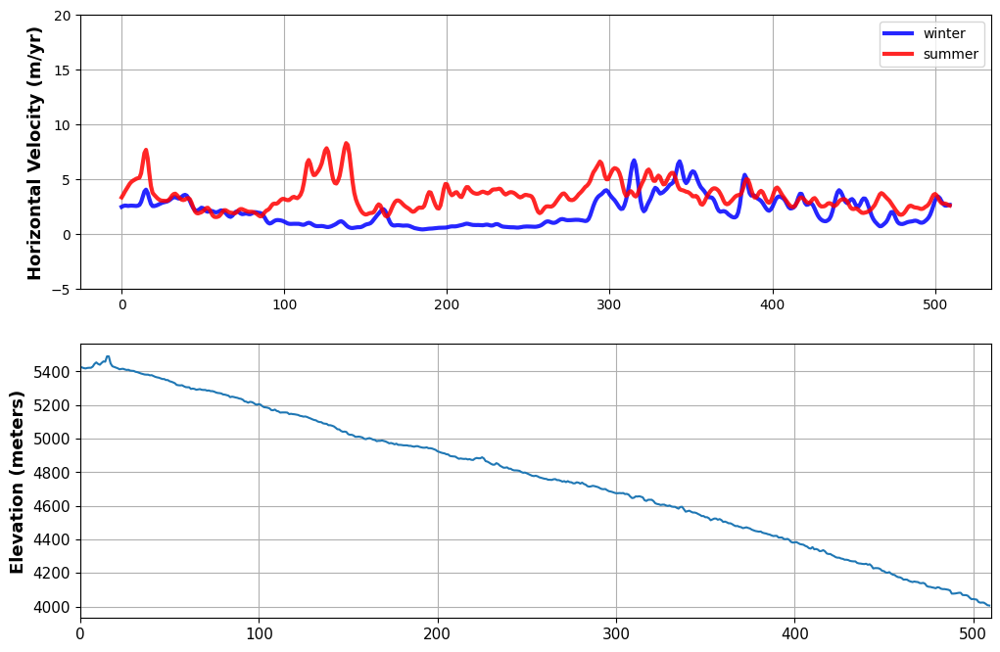

In [50]:
gl = 0
dem = dem_list[gl]
V_mavg, V_m25tile, V_m75tile = create_cross_sect(Vh_list[gl][winter_idx,:])
V_mavg_s, V_m25tile_s, V_m75tile_s = create_cross_sect(Vh_list[gl][summer_idx,:])

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
V_mavg_s_ga = filters.convolve1d(V_mavg_s, b / b.sum(), mode="reflect")

# poly = []
# for i in range(len(itr)-1):
#     poly.append(np.poly1d(np.polyfit(range(len(V_mavg[itr[i]:itr[i+1]])), V_mavg[itr[i]:itr[i+1]], 1)))

# polyh = []
# for i in range(len(itr)-1):
#     polyh.append(np.poly1d(np.polyfit(range(len(Vh_mavg[itr[i]:itr[i+1]])), Vh_mavg[itr[i]:itr[i+1]], 1)))

# p2 = np.poly1d(np.polyfit(range(len(V_mavg)), V_mavg, 2))
# ph2 = np.poly1d(np.polyfit(range(len(V_mavg)), Vh_mavg, 1))

fig, ax = plt.subplots(2, figsize=(12, 8), gridspec_kw={'height_ratios': [1, 1]})

ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='blue', label='winter', linewidth=3, alpha=0.85)
ax[0].plot(range(len(V_mavg)), V_mavg_s_ga, '-', color='red', label='summer', linewidth=3, alpha=0.85)
# ax[0].scatter(range(len(V_mavg)), V_mavg)
# ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
# for i in range(len(itr)-1):
#     ax[0].plot(range(itr[i],itr[i+1]), poly[i](range(len(V_mavg[itr[i]:itr[i+1]]))), '-', color='#00C5B0', alpha=0.7)

# ax[0].plot(range(len(V_mavg)), p2(range(len(V_mavg))), '-', color='#00C5B0', alpha=0.7)
# ax[0].set_xticks(date_idx, date_plot, fontsize=10.5)
ax[0].set_ylabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[0].set_ylim(-5, 20)
ax[0].grid()
ax[0].legend()

ax[1].plot(dem)
ax[1].set_xlim(0, dem.shape[0])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
ax[1].grid()

plt.show()

In [25]:
V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_list[3])

/tmp/ipykernel_232462/3514406010.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")


In [26]:
V_mavg[np.logical_not(np.isnan(V_mavg))].mean()

14.132698

/tmp/ipykernel_1325881/3514406010.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")


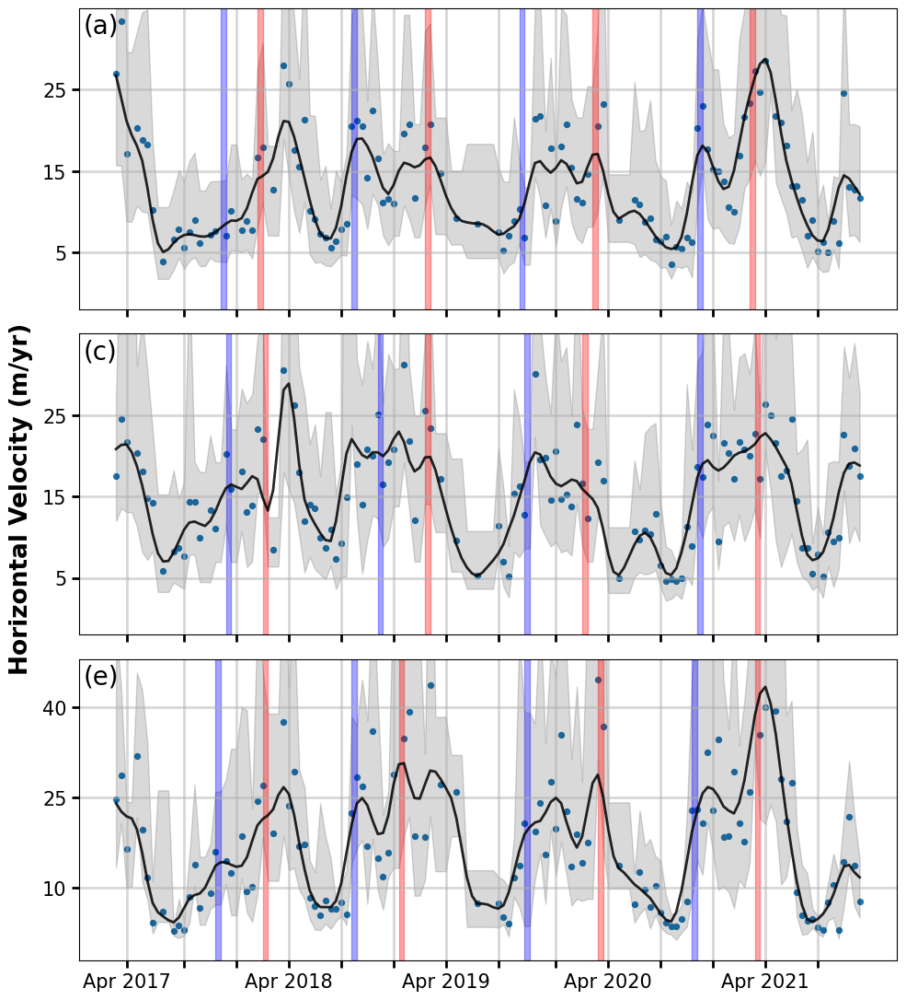

In [6]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
date_plot_maj = date_plot.copy()
date_plot_maj = [date_plot[n] if n%3==0 else '' for n in range(len(date_plot))]

fig, ax = plt.subplots(3, figsize=(10, 11), gridspec_kw={'height_ratios': [1, 1, 1]})

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_list[0])
summer_spd = [28, 60, 92, 122]
winter_spd = [21, 46, 78, 112]
ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[0].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[0].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[0].set_xticks(date_idx, [])
ax[0].set_yticks(np.arange(-5, 35, 10), np.arange(-5, 35, 10), fontsize=15)
ax[0].text(0.005, 0.9, '(a)', horizontalalignment='left', verticalalignment='bottom', transform=ax[0].transAxes,
        fontsize=20)
# ax[0].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[0].set_ylim(-2, 35)
ax[0].grid(linewidth=2)
ax[0].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_list[1])
# summer_spd = [27, 54, 88, 123]
# winter_spd = [15, 46, 79, 114]
summer_spd = [29, 60, 90, 123]
winter_spd = [22, 51, 79, 112]
ax[1].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[1].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[1].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[1].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[1].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[1].set_xticks(date_idx, [])
ax[1].set_yticks(np.arange(-5, 35, 10), np.arange(-5, 35, 10), fontsize=15)
# ax[1].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[1].set_ylim(-2, 35)
ax[1].grid(linewidth=2)
ax[1].text(0.005, 0.9, '(c)', horizontalalignment='left', verticalalignment='bottom', transform=ax[1].transAxes,
        fontsize=20)
ax[1].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################


summer_spd = [29, 55, 93, 123]
winter_spd = [20, 46, 79, 111]
V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_list[3])
ax[2].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[2].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[2].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[2].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[2].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[2].set_xticks(date_idx, date_plot_maj, fontsize=15)
ax[2].set_yticks(np.arange(-5, 50, 15), np.arange(-5, 50, 15), fontsize=15)
# ax[2].set_ylabel("Vertical\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
ax[2].set_ylim(-2, 48)
ax[2].grid(linewidth=2)
ax[2].text(0.005, 0.9, '(e)', horizontalalignment='left', verticalalignment='bottom', transform=ax[2].transAxes,
        fontsize=20)
ax[2].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)

# plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
# plt.xlabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
fig.supylabel('Horizontal Velocity (m/yr)', x=0.02, fontweight='bold', fontsize=19)
fig.tight_layout()
plt.savefig('/DATA/Plots/ts_plot_hor_nonncc.png')
plt.show()

/tmp/ipykernel_1325881/3514406010.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")


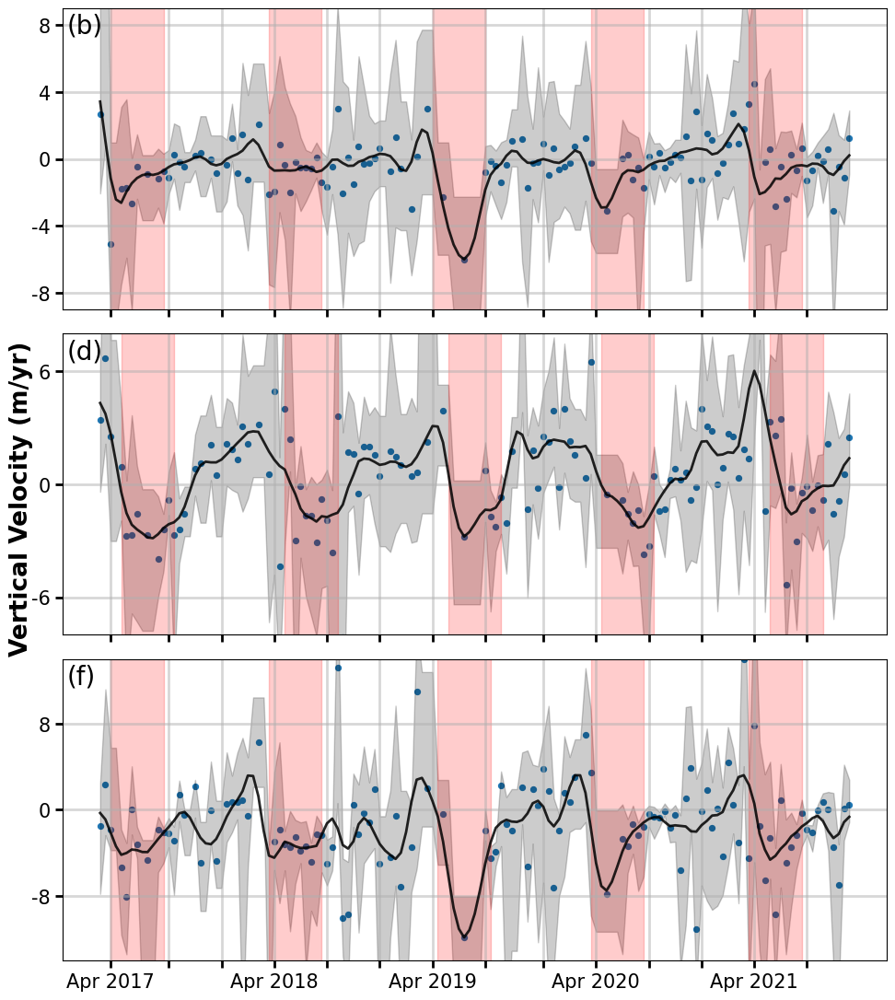

In [7]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
date_plot_maj = date_plot.copy()
date_plot_maj = [date_plot[n] if n%3==0 else '' for n in range(len(date_plot))]

fig, ax = plt.subplots(3, figsize=(10, 11), gridspec_kw={'height_ratios': [1, 1, 1]})

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(Vh_list[0])
summer_spd = [3, 33, 64, 94, 124]
# winter_spd = [21, 46, 78, 112]
ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.2, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[0].fill_between(range(summer_spd[li]-1,summer_spd[li]+10), -40, 48, alpha=0.2, color='red')
# for li in range(len(winter_spd)):
#     ax[0].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[0].set_xticks(date_idx, [])
ax[0].set_yticks(np.arange(-12, 12, 4), np.arange(-12, 12, 4), fontsize=15)
ax[0].text(0.005, 0.9, '(b)', horizontalalignment='left', verticalalignment='bottom', transform=ax[0].transAxes,
        fontsize=20)
# ax[0].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[0].set_ylim(-9, 9)
ax[0].grid(linewidth=2)
ax[0].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(Vh_list[1])
# summer_spd = [27, 54, 88, 123]
# winter_spd = [15, 46, 79, 114]
summer_spd = [5, 36, 67, 96, 128]
# winter_spd = [22, 51, 79, 112]
ax[1].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[1].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[1].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.2, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[1].fill_between(range(summer_spd[li]-1,summer_spd[li]+10), -40, 48, alpha=0.2, color='red')
# for li in range(len(winter_spd)):
#     ax[1].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[1].set_xticks(date_idx, [])
ax[1].set_yticks(np.arange(-12, 12, 6), np.arange(-12, 12, 6), fontsize=15)
# ax[1].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[1].set_ylim(-8, 8)
ax[1].grid(linewidth=2)
ax[1].text(0.005, 0.9, '(d)', horizontalalignment='left', verticalalignment='bottom', transform=ax[1].transAxes,
        fontsize=20)
ax[1].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################


summer_spd = [3, 33, 65, 94, 124]
winter_spd = [20, 46, 79, 111]
V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(Vh_list[3])
ax[2].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[2].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[2].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.2, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[2].fill_between(range(summer_spd[li]-1,summer_spd[li]+10), -40, 40, alpha=0.20, color='red')
# for li in range(len(winter_spd)):
#     ax[2].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[2].set_xticks(date_idx, date_plot_maj, fontsize=15)
ax[2].set_yticks(np.arange(-16, 16, 8), np.arange(-16, 16, 8), fontsize=15)
# ax[2].set_ylabel("Vertical\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
ax[2].set_ylim(-14, 14)
ax[2].grid(linewidth=2)
ax[2].text(0.005, 0.9, '(f)', horizontalalignment='left', verticalalignment='bottom', transform=ax[2].transAxes,
        fontsize=20)
ax[2].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)

# plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
# plt.xlabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
fig.supylabel('Vertical Velocity (m/yr)', x=0.032, fontweight='bold', fontsize=19)
fig.tight_layout()
plt.savefig('/DATA/Plots/ts_plot_vert_nonncc.png')
plt.show()

/tmp/ipykernel_1393725/3514406010.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")


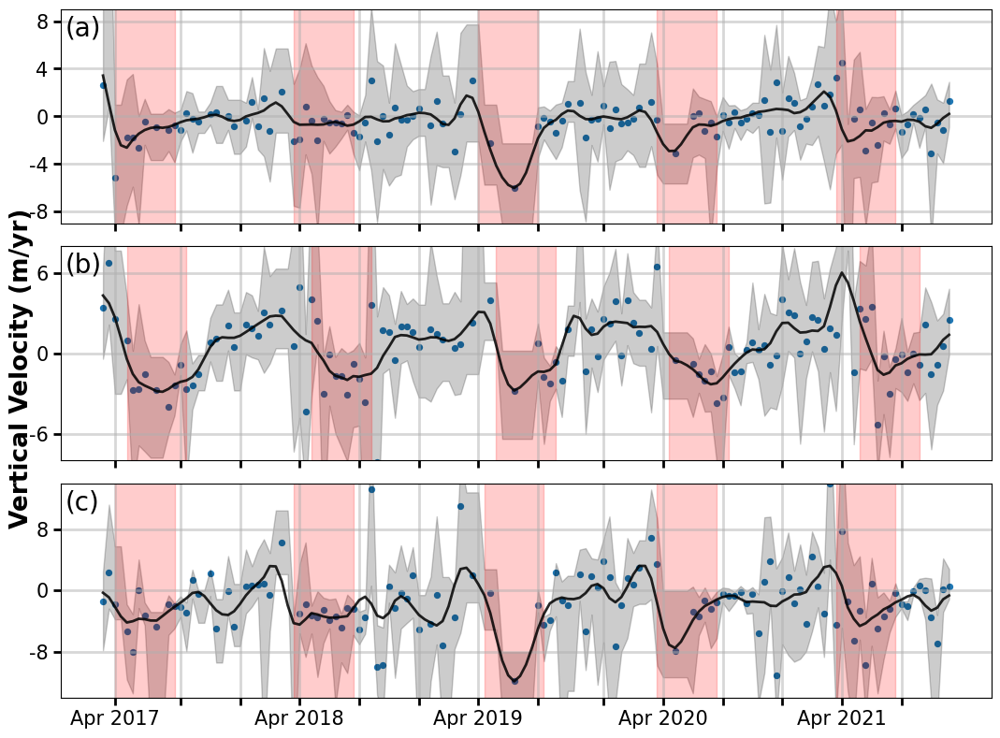

In [20]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
date_plot_maj = date_plot.copy()
date_plot_maj = [date_plot[n] if n%3==0 else '' for n in range(len(date_plot))]

fig, ax = plt.subplots(3, figsize=(11, 8), gridspec_kw={'height_ratios': [1, 1, 1]})

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(Vh_list[0])
summer_spd = [3, 33, 64, 94, 124]
# winter_spd = [21, 46, 78, 112]
ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.2, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[0].fill_between(range(summer_spd[li]-1,summer_spd[li]+10), -40, 48, alpha=0.2, color='red')
# for li in range(len(winter_spd)):
#     ax[0].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[0].set_xticks(date_idx, [])
ax[0].set_yticks(np.arange(-12, 12, 4), np.arange(-12, 12, 4), fontsize=15)
ax[0].text(0.005, 0.85, '(a)', horizontalalignment='left', verticalalignment='bottom', transform=ax[0].transAxes,
        fontsize=20)
# ax[0].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[0].set_ylim(-9, 9)
ax[0].grid(linewidth=2)
ax[0].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(Vh_list[1])
# summer_spd = [27, 54, 88, 123]
# winter_spd = [15, 46, 79, 114]
summer_spd = [5, 36, 67, 96, 128]
# winter_spd = [22, 51, 79, 112]
ax[1].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[1].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[1].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.2, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[1].fill_between(range(summer_spd[li]-1,summer_spd[li]+10), -40, 48, alpha=0.2, color='red')
# for li in range(len(winter_spd)):
#     ax[1].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[1].set_xticks(date_idx, [])
ax[1].set_yticks(np.arange(-12, 12, 6), np.arange(-12, 12, 6), fontsize=15)
# ax[1].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[1].set_ylim(-8, 8)
ax[1].grid(linewidth=2)
ax[1].text(0.005, 0.85, '(b)', horizontalalignment='left', verticalalignment='bottom', transform=ax[1].transAxes,
        fontsize=20)
ax[1].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################


summer_spd = [3, 33, 65, 94, 124]
winter_spd = [20, 46, 79, 111]
V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(Vh_list[3])
ax[2].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[2].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[2].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.2, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[2].fill_between(range(summer_spd[li]-1,summer_spd[li]+10), -40, 40, alpha=0.20, color='red')
# for li in range(len(winter_spd)):
#     ax[2].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[2].set_xticks(date_idx, date_plot_maj, fontsize=15)
ax[2].set_yticks(np.arange(-16, 16, 8), np.arange(-16, 16, 8), fontsize=15)
# ax[2].set_ylabel("Vertical\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
ax[2].set_ylim(-14, 14)
ax[2].grid(linewidth=2)
ax[2].text(0.005, 0.85, '(c)', horizontalalignment='left', verticalalignment='bottom', transform=ax[2].transAxes,
        fontsize=20)
ax[2].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)

# plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
# plt.xlabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
fig.supylabel('Vertical Velocity (m/yr)', x=0.032, fontweight='bold', fontsize=19)
fig.tight_layout()
# plt.savefig('/DATA/Plots/ts_plot_vert_thesis.png')
plt.show()

### NCC Stacking Scatter Reduction Plot

In [39]:
# Vh_ncc = Vh_list.copy()
# Vh_nonncc = Vh_list.copy()
# V_nonncc = V_list.copy()
V_ncc = V_list.copy()

/tmp/ipykernel_1393725/3514406010.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")


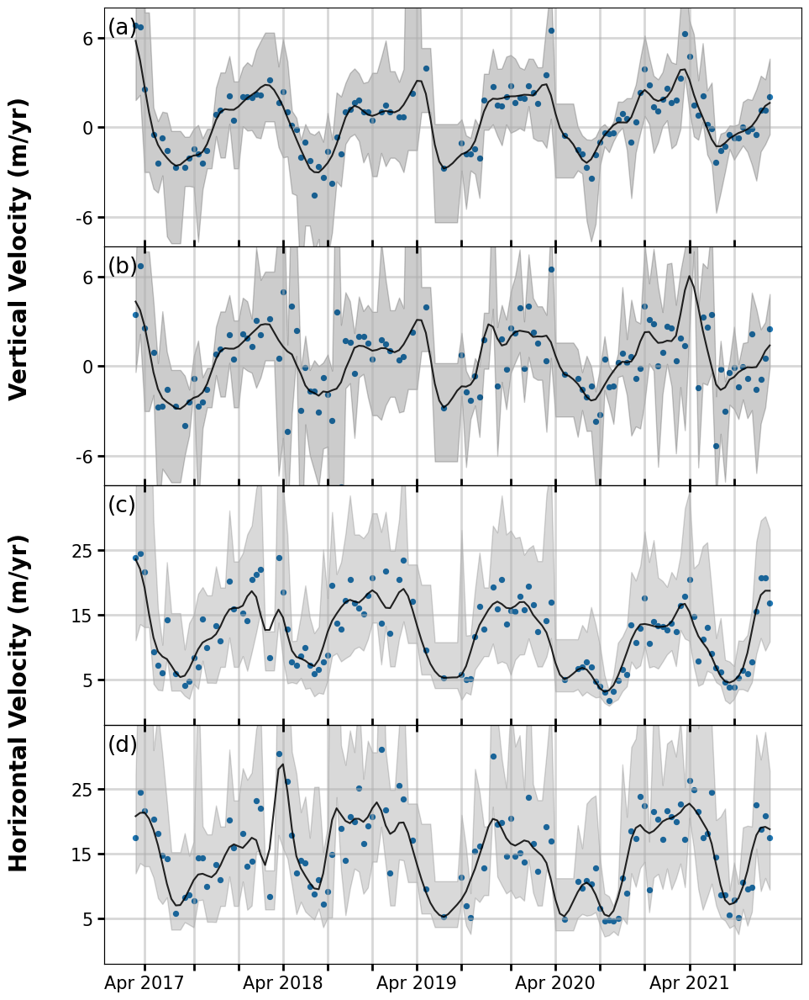

In [83]:

# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)

date_plot_maj = date_plot.copy()
date_plot_maj = [date_plot[n] if n%3==0 else '' for n in range(len(date_plot))]

fig, ax = plt.subplots(4, figsize=(9,12), sharex=True, gridspec_kw={'hspace':0 ,'height_ratios': [1, 1, 1, 1]})

############################################################

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(Vh_ncc[1])
# summer_spd = [27, 54, 88, 123]
# winter_spd = [15, 46, 79, 114]
summer_spd = [5, 36, 67, 96, 128]
# winter_spd = [22, 51, 79, 112]
ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=1.5, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.2, color='black', label="25th to 75th %")
# for li in range(len(summer_spd)):
#     ax[0].fill_between(range(summer_spd[li]-1,summer_spd[li]+10), -40, 48, alpha=0.2, color='red')
    
ax[0].set_xticks(date_idx, [])
ax[0].set_yticks(np.arange(-12, 12, 6), np.arange(-12, 12, 6), fontsize=15)
ax[0].set_ylim(-8, 8)
ax[0].grid(linewidth=2)
ax[0].text(0.005, 0.87, '(a)', horizontalalignment='left', verticalalignment='bottom', transform=ax[0].transAxes,
        fontsize=19)
ax[0].tick_params(direction='in', length=6, width=2, grid_alpha=0.5)
ax[0].tick_params(axis='y', direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################

# summer_spd = [3, 33, 65, 94, 124]
# winter_spd = [20, 46, 79, 111]
V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(Vh_nonncc[1])
ax[1].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=1.5, alpha=0.85)
ax[1].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[1].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.2, color='black', label="25th to 75th %")
# for li in range(len(summer_spd)):
#     ax[1].fill_between(range(summer_spd[li]-1,summer_spd[li]+10), -40, 40, alpha=0.20, color='red')
# for li in range(len(winter_spd)):
#     ax[1].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
ax[1].set_xticks(date_idx, [])  
# ax[1].set_xticks(date_idx, date_plot_maj, fontsize=15)
ax[1].set_yticks(np.arange(-12, 12, 6), np.arange(-12, 12, 6), fontsize=15)
ax[1].set_ylim(-8, 8)
ax[1].grid(linewidth=2)
ax[1].text(0.005, 0.87, '(b)', horizontalalignment='left', verticalalignment='bottom', transform=ax[1].transAxes,
        fontsize=19)
ax[1].tick_params(direction='in', length=6, width=2, grid_alpha=0.5)
ax[1].tick_params(axis='y', direction='out', length=6, width=2, grid_alpha=0.5)
ax1 = ax[1].twiny()
ax1.set_xbound(ax[1].get_xbound())
ax1.set_xticks(date_idx[::3], [])
ax1.tick_params(direction='in', length=6, width=2, grid_alpha=0.5)


############################################################

# summer_spd = [3, 33, 65, 94, 124]
# winter_spd = [20, 46, 79, 111]
V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_ncc[1])
summer_spd = [29, 60, 90, 123]
winter_spd = [22, 51, 79, 112]
ax[2].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=1.5, alpha=0.85)
ax[2].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[2].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
# for li in range(len(summer_spd)):
#     ax[2].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
# for li in range(len(winter_spd)):
#     ax[2].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[2].set_xticks(date_idx, [])
ax[2].set_yticks(np.arange(-5, 35, 10), np.arange(-5, 35, 10), fontsize=15)
# ax[2].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[2].set_ylim(-2, 35)
ax[2].grid(linewidth=2)
ax[2].text(0.005, 0.87, '(c)', horizontalalignment='left', verticalalignment='bottom', transform=ax[2].transAxes,
        fontsize=19)
ax[2].tick_params(direction='in', length=6, width=2, grid_alpha=0.5)
ax[2].tick_params(axis='y', direction='out', length=6, width=2, grid_alpha=0.5)

ax2 = ax[2].twiny()
ax2.set_xbound(ax[2].get_xbound())
ax2.set_xticks(date_idx[::3], [])
ax2.tick_params(direction='in', length=6, width=2, grid_alpha=0.5)

############################################################

# summer_spd = [3, 33, 65, 94, 124]
# winter_spd = [20, 46, 79, 111]
V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_nonncc[1])
# summer_spd = [29, 60, 90, 123]
# winter_spd = [22, 51, 79, 112]
ax[3].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=1.5, alpha=0.85)
ax[3].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[3].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
# for li in range(len(summer_spd)):
#     ax[3].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
# for li in range(len(winter_spd)):
#     ax[3].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[3].set_xticks(date_idx, date_plot_maj, fontsize=15)
ax[3].set_yticks(np.arange(-5, 35, 10), np.arange(-5, 35, 10), fontsize=15)
# ax[3].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[3].set_ylim(-2, 35)
ax[3].grid(linewidth=2)
ax[3].text(0.005, 0.87, '(d)', horizontalalignment='left', verticalalignment='bottom', transform=ax[3].transAxes,
        fontsize=19)
ax[3].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)

ax3 = ax[3].twiny()
ax3.set_xbound(ax[3].get_xbound())
ax3.set_xticks(date_idx[::3], [])
ax3.tick_params(direction='in', length=6, width=2, grid_alpha=0.5)


# plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
# plt.xlabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
# fig.supylabel('-----------------', x=0.032, fontweight='bold', fontsize=19)
fig.tight_layout()
fig.text(-0.05, 0.75, 'Vertical Velocity (m/yr)', fontweight='bold', va='center', ha='center', rotation='vertical', fontsize=20)
fig.text(-0.05, 0.3, 'Horizontal Velocity (m/yr)', fontweight='bold', va='center', ha='center', rotation='vertical', fontsize=20)


plt.savefig('/DATA/Plots/ncc_scatter_show2.png')
plt.show()

/tmp/ipykernel_1393725/3514406010.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")


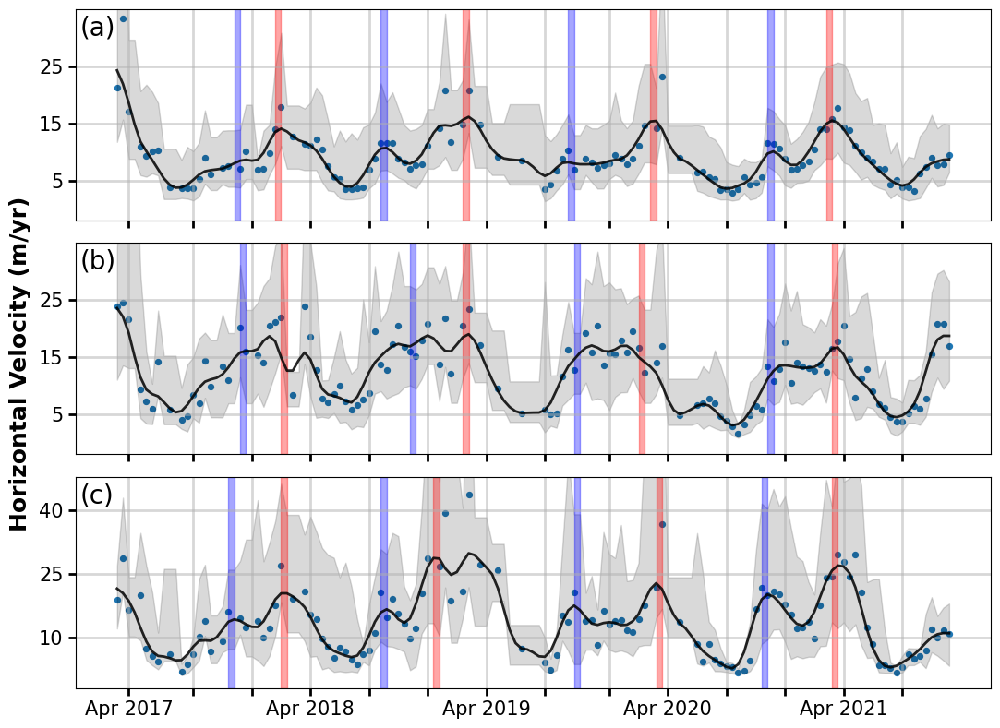

In [38]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
date_plot_maj = date_plot.copy()
date_plot_maj = [date_plot[n] if n%3==0 else '' for n in range(len(date_plot))]

fig, ax = plt.subplots(3, figsize=(11, 8), gridspec_kw={'height_ratios': [1, 1, 1]})

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_list[0])
summer_spd = [28, 60, 92, 122]
winter_spd = [21, 46, 78, 112]
ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[0].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[0].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[0].set_xticks(date_idx, [])
ax[0].set_yticks(np.arange(-5, 35, 10), np.arange(-5, 35, 10), fontsize=15)
ax[0].text(0.005, 0.85, '(a)', horizontalalignment='left', verticalalignment='bottom', transform=ax[0].transAxes,
        fontsize=20)
# ax[0].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[0].set_ylim(-2, 35)
ax[0].grid(linewidth=2)
ax[0].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################

V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_list[1])
# summer_spd = [27, 54, 88, 123]
# winter_spd = [15, 46, 79, 114]
summer_spd = [29, 60, 90, 123]
winter_spd = [22, 51, 79, 112]
ax[1].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[1].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[1].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[1].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[1].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[1].set_xticks(date_idx, [])
ax[1].set_yticks(np.arange(-5, 35, 10), np.arange(-5, 35, 10), fontsize=15)
# ax[1].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[1].set_ylim(-2, 35)
ax[1].grid(linewidth=2)
ax[1].text(0.005, 0.85, '(b)', horizontalalignment='left', verticalalignment='bottom', transform=ax[1].transAxes,
        fontsize=20)
ax[1].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

############################################################


summer_spd = [29, 55, 93, 123]
winter_spd = [20, 46, 79, 111]
V_mavg, V_mavg2, V_m25tile, V_m75tile, V_mavg_ga = generate_data_Vplot(V_list[3])
ax[2].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2, alpha=0.85)
ax[2].scatter(range(len(V_mavg)), V_mavg2, s=18)
ax[2].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[2].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[2].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[2].set_xticks(date_idx, date_plot_maj, fontsize=15)
ax[2].set_yticks(np.arange(-5, 50, 15), np.arange(-5, 50, 15), fontsize=15)
# ax[2].set_ylabel("Vertical\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
ax[2].set_ylim(-2, 48)
ax[2].grid(linewidth=2)
ax[2].text(0.005, 0.85, '(c)', horizontalalignment='left', verticalalignment='bottom', transform=ax[2].transAxes,
        fontsize=20)
ax[2].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)

# plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
# plt.xlabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
fig.supylabel('Horizontal Velocity (m/yr)', x=0.02, fontweight='bold', fontsize=18)
fig.tight_layout()
# plt.savefig('/DATA/Plots/ts_plot_hor_thesis.png')
plt.show()

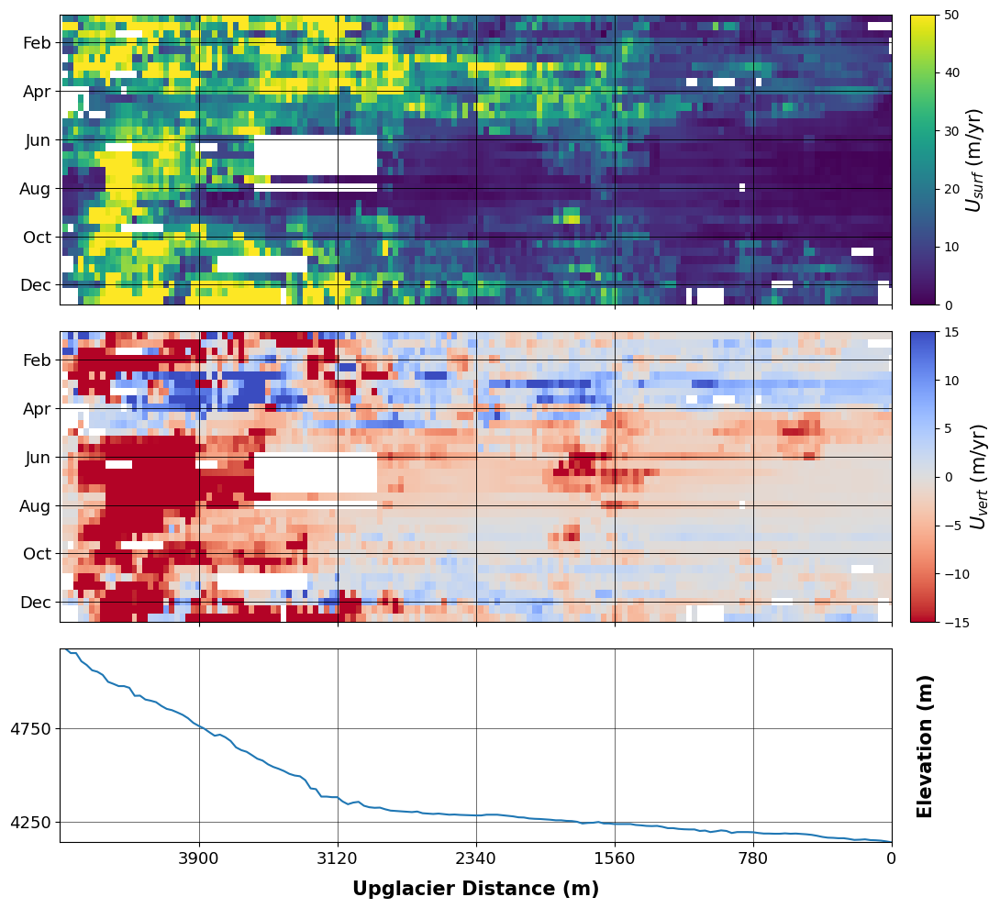

In [27]:
gl_no = 3

V_month_avg = []
Vh_month_avg = []
mnth_idx = []
for mn in range(1, 13):
    for i in range(3):
        store = []
        storeh = []
        V_perc_l = moving_avg(V_list[gl_no], 5, 1)
        Vh_perc_l = moving_avg(Vh_list[gl_no], 5, 1)
        
        for j, dt in enumerate(date_prox):
            if (mn==dt.month)&(i==(dt.day//11)):
                # store.append(V_perc_list[gl_no][j])
                # storeh.append(Vh_perc_list[gl_no][j])
                store.append(V_perc_l[j])
                storeh.append(Vh_perc_l[j])

        v_avg, _, _ = create_cross_sect2(np.array(store))
        vh_avg, _, _ = create_cross_sect2(np.array(storeh))
        V_month_avg.append(v_avg)
        Vh_month_avg.append(vh_avg)
        mnth_idx.append(month[mn])

V_month_avg = np.array(V_month_avg)
Vh_month_avg = np.array(Vh_month_avg)

fig, ax = plt.subplots(3, figsize=(11, 10), gridspec_kw={'height_ratios': [1.5, 1.5, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V_month_avg.shape[1], 0, V_month_avg.shape[0]]
V[np.isnan(V)] = 0
im = ax[0].imshow(V_month_avg[:], vmin=0, vmax=50, cmap='viridis', aspect='auto')
ax[0].set_xlim(V_month_avg.shape[1], 0)
ax[0].set_xticks(range(0, V_month_avg.shape[1], V_month_avg.shape[1]//6), [])
ax[0].set_yticks(range(3, len(mnth_idx), 6), mnth_idx[3::6], fontsize=13)
ax[0].xaxis.set_tick_params(labelsize=11)
ax[0].grid(linewidth=0.6, color='black')
ax[0].tick_params(direction='out', grid_alpha=1)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ticks=np.linspace(0, 50, 6, endpoint=True), ax=ax[0], cax=cax)
cbar.set_label('$U_{surf}$ (m/yr)', fontsize=15, labelpad=3.5)

extent = [0, Vh_month_avg.shape[1], 0, Vh_month_avg.shape[0]]
# V[np.isnan(V)] = 0
im = ax[1].imshow(Vh_month_avg[:], vmin=-15, vmax=15, cmap='coolwarm_r', aspect='auto')
ax[1].set_xlim(V_month_avg.shape[1], 0)
ax[1].set_xticks(range(0, Vh_month_avg.shape[1], Vh_month_avg.shape[1]//6), [])
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[1].set_yticks(range(3, len(mnth_idx), 6), mnth_idx[3::6], fontsize=13)
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].grid(linewidth=0.6, color='black')
divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[1], cax=cax)
cbar.set_label('$U_{vert}$ (m/yr)', fontsize=15, labelpad=-1.5)


dem = dem_list[gl_no]
ax[2].plot(dem)
ax[2].set_xlim(V_month_avg.shape[1], 0)
ax[2].set_ylim(dem.min(), dem.max())
plt_xidx = [int(dis) for dis in range(0, Vh_month_avg.shape[1]*30, (Vh_month_avg.shape[1]//6)*30)]
ax[2].set_yticks(np.arange(((dem.min()//250)+1)*250, dem.max(), 500), np.arange(((dem.min()//250)+1)*250, dem.max(), 500), fontsize=11)
ax[2].set_xticks(range(0, Vh_month_avg.shape[1], Vh_month_avg.shape[1]//6), plt_xidx)
ax[2].xaxis.set_tick_params(labelsize=13)
ax[2].yaxis.set_tick_params(labelsize=13)
ax[2].grid(linewidth=0.4, color='black')
ax[2].set_ylabel("Elevation (m)", fontweight='bold', fontsize=15, labelpad=20)
ax[2].set_xlabel("Upglacier Distance (m)", fontweight='bold', fontsize=15, labelpad=10)
divider2 = make_axes_locatable(ax[2])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
ax[2].yaxis.set_label_position("right")
# ax[2].yaxis.tick_right()
plt.tight_layout()
# plt.show()
plt.savefig('/DATA/Plots/geepang_gath_mntrend_thesis.png')
plt.show()

In [63]:
V_perc2 = moving_avg(V_perc, 5, 2)
Vh_perc2 = moving_avg(Vh_perc, 5, 2)

V2 = moving_avg(V, 5, 2)
Vh2 = moving_avg(Vh, 5, 2)

In [64]:
# src = rasterio.open('/DATA/Avg_velocity.tif')
src = rasterio.open('/DATA/run_2017_19/Avg_velocity_17_22.tif')
src_arr = src.read()
# v = np.array([sample_point(coordi, src_arr) for coordi in coords_img])
v_avg = np.array([x for x in src.sample(coords)])[::-1]

In [65]:
vhor = np.sqrt(v_avg[:,0]**2 + v_avg[:,1]**2)
vvert = v_avg[:,2]

In [18]:
vhor = np.array([v[np.logical_not(np.isnan(v))].mean() for v in V.T])[::-1][::-1]
vvert = np.array([v[np.logical_not(np.isnan(v))].mean() for v in Vh.T])[::-1]

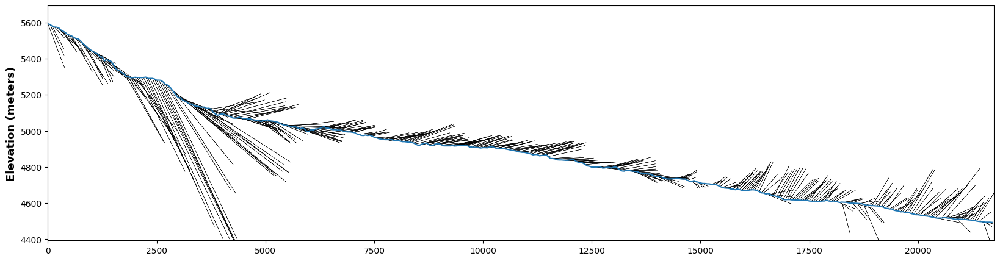

In [66]:
fig, ax = plt.subplots(1, figsize=(20, 5))
xlimm = dem[::-1].shape[0]
dem_rev = dem[::-1].copy()
# xlimm = 100
x_points = np.arange(0, xlimm)
y_points = dem_rev[x_points].copy()
# xfac = 30 # 3_2
xfac = 50 # 3_2
xlab = np.arange(0, xlimm, 1)*xfac

plt.plot(xlab, dem_rev[:xlimm])
plt.xlim(0, xlimm*xfac)
plt.ylim(dem_rev[:xlimm].min()-100, dem_rev[:xlimm].max()+100)

scale = 80
for i in range(len(x_points)):
    x, y = x_points[i], y_points[i][0]
    # print(i)
    if np.isnan(vhor[x])|np.isnan(vvert[x]):
        continue
        
    vx = (vhor[x])*scale
    vy = vvert[x]*scale
    # p = 0.5*(x + y)  # coordinate of the orthogonal point
    plt.arrow(x*xfac, y, vx, -vy,
              color="black",
              # linestyle="dashed",
              linewidth=0.3,
              head_width=0.5,
              length_includes_head=True)

# ax[1].xaxis.set_tick_params(labelsize=11)
# ax[1].yaxis.set_tick_params(labelsize=11)
plt.ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
# divider2 = make_axes_locatable(ax[1])
# cax2 = divider2.append_axes("right", size="3%", pad=.2)
plt.show()

In [7]:
def plot_crossSec(V_perc, dem):
    fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})

    V_perc2 = V_perc.copy()
    extent = [0, V_perc.shape[1], 0, V_perc.shape[0]]
    V[np.isnan(V)] = 0
    im = ax[0].imshow(V_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
    # im = ax[0].imshow(V_perc[:], vmin=-150, vmax=150, cmap='bwr', aspect='auto')
    # ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
    ax[0].set_yticks(date_idx, date_plot, fontsize=11)
    ax[0].xaxis.set_tick_params(labelsize=11)
    divider = make_axes_locatable(ax[0])
    cax = divider.append_axes("right", size="3%", pad=.2)
    cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
    cbar.set_label('$ΔU_{surf}$ (%)', fontsize=13)
    
    ax[1].plot(dem)
    ax[1].set_xlim(0, V.shape[1])
    ax[1].xaxis.set_tick_params(labelsize=11)
    ax[1].yaxis.set_tick_params(labelsize=11)
    ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
    divider2 = make_axes_locatable(ax[1])
    cax2 = divider2.append_axes("right", size="3%", pad=.2)
    cax2.remove()
    plt.tight_layout()
    plt.show()
    

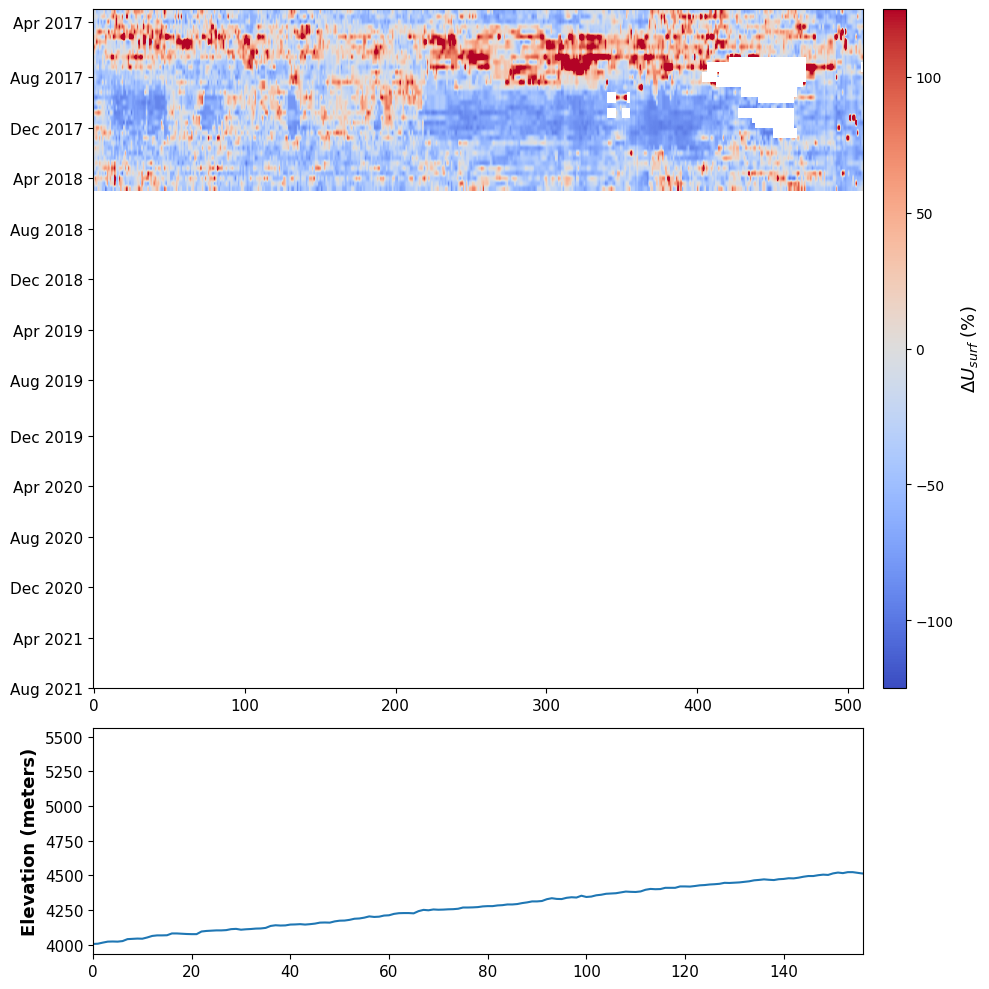

In [99]:
plot_crossSec(V_month_avg, dem_list[0])

### Glacier 1

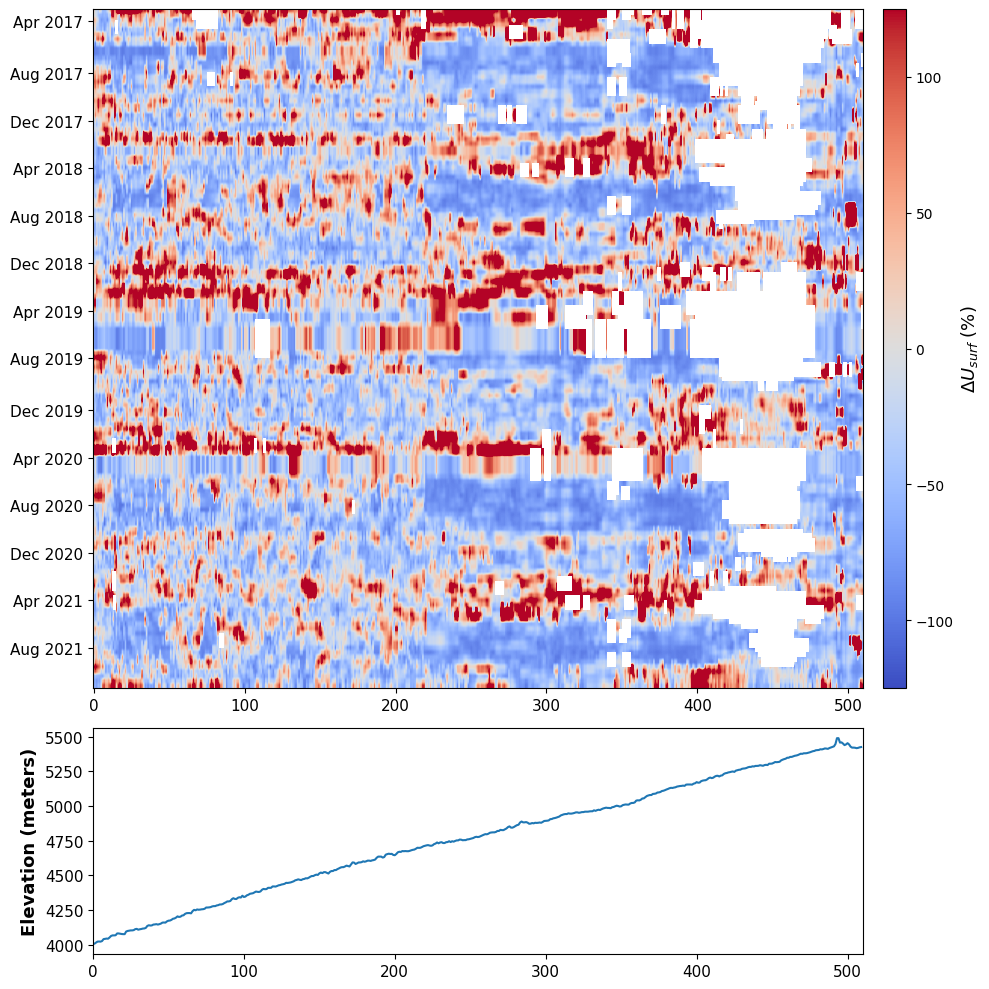

In [16]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V_perc.shape[1], 0, V_perc.shape[0]]
V[np.isnan(V)] = 0
im = ax[0].imshow(V_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
# im = ax[0].imshow(V_perc[:], vmin=-150, vmax=150, cmap='bwr', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{surf}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, V.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
plt.show()

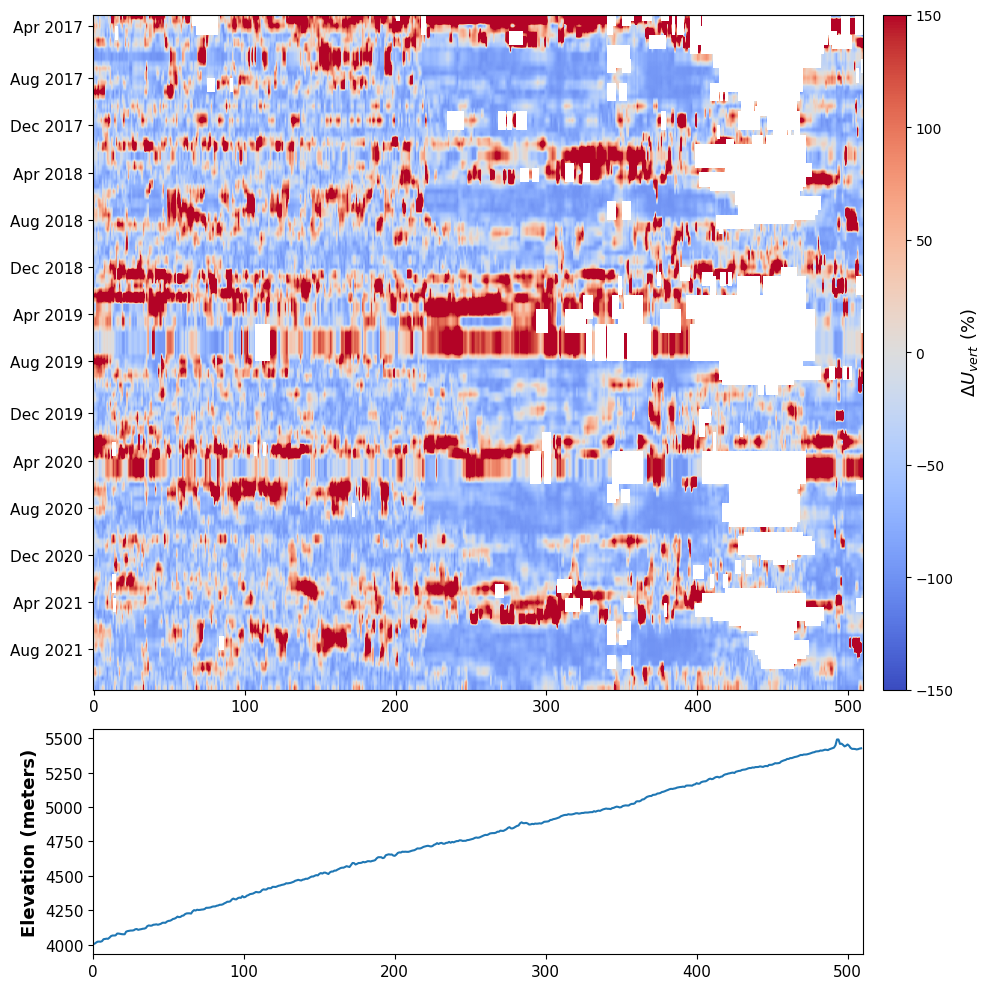

In [17]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, Vh.shape[1], 0, Vh.shape[0]]
# Vh[np.isnan(Vh)] = 0
im = ax[0].imshow(Vh_perc2[:], vmin=-150, vmax=150, cmap='coolwarm', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{vert}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, V.shape[1])
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
# plt.suptitle("")
plt.show()

In [20]:
itr = [13, 43, 73, 104, 134]

In [9]:
V_mavg, V_m25tile, V_m75tile = create_cross_sect(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_cross_sect(Vh)

/tmp/ipykernel_10550/1537827250.py:5: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_10550/1537827250.py:6: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


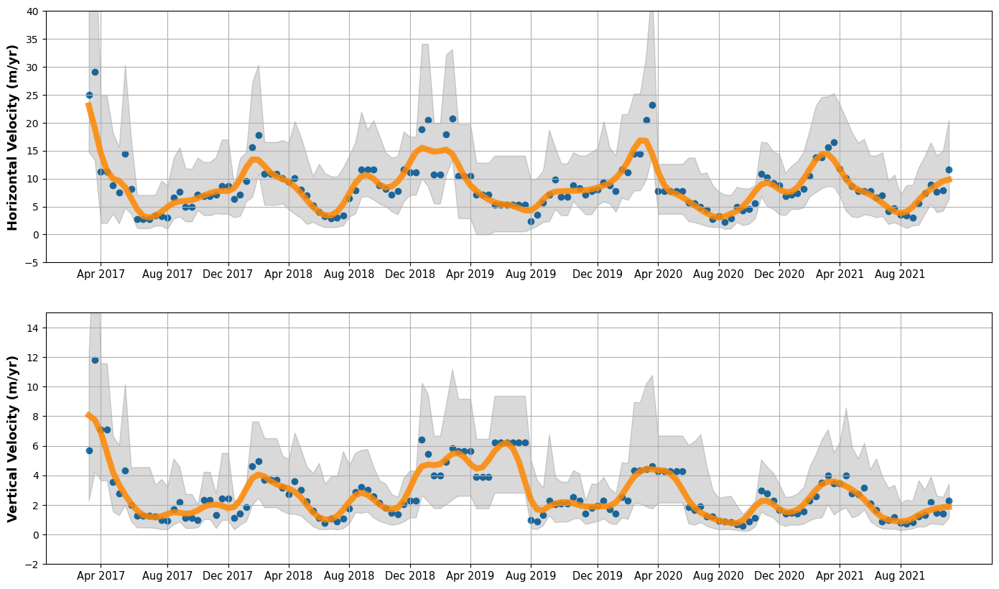

In [21]:
V_mavg, V_m25tile, V_m75tile = create_series(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_series(Vh)

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")

poly = []
for i in range(len(itr)-1):
    poly.append(np.poly1d(np.polyfit(range(len(V_mavg[itr[i]:itr[i+1]])), V_mavg[itr[i]:itr[i+1]], 1)))

polyh = []
for i in range(len(itr)-1):
    polyh.append(np.poly1d(np.polyfit(range(len(Vh_mavg[itr[i]:itr[i+1]])), Vh_mavg[itr[i]:itr[i+1]], 1)))

# p2 = np.poly1d(np.polyfit(range(len(V_mavg)), V_mavg, 2))
# ph2 = np.poly1d(np.polyfit(range(len(V_mavg)), Vh_mavg, 1))

fig, ax = plt.subplots(2, figsize=(17, 10), gridspec_kw={'height_ratios': [1, 1]})

ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
# for i in range(len(itr)-1):
#     ax[0].plot(range(itr[i],itr[i+1]), poly[i](range(len(V_mavg[itr[i]:itr[i+1]]))), '-', color='#00C5B0', alpha=0.7)

# ax[0].plot(range(len(V_mavg)), p2(range(len(V_mavg))), '-', color='#00C5B0', alpha=0.7)
ax[0].set_xticks(date_idx, date_plot, fontsize=10.5)
ax[0].set_ylabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[0].set_ylim(-5, 40)
ax[0].grid()

ax[1].plot(range(len(V_mavg)), Vh_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.85)
ax[1].scatter(range(len(Vh_mavg)), Vh_mavg)
ax[1].fill_between(range(len(Vh_mavg)), Vh_m75tile, Vh_m25tile, alpha=0.15, color='black', label="25th to 75th %")
# ax[1].plot(range(len(Vh_mavg)), ph2(range(len(Vh_mavg))), '-', color='#00C5B0', alpha=0.7)
# for i in range(len(itr)-1):
#     ax[1].plot(range(itr[i],itr[i+1]), polyh[i](range(len(Vh_mavg[itr[i]:itr[i+1]]))), '-', color='#00C5B0', alpha=0.7)

# ax[1].set_xticks(range(len(date_ml))[0::10], date_ml[0::10], fontsize=10)
ax[1].set_xticks(date_idx, date_plot, fontsize=10.5)
ax[1].set_ylabel("Vertical Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[1].set_ylim(-2, 15)
ax[1].grid()

plt.show()

/tmp/ipykernel_180542/1882951872.py:11: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_180542/1882951872.py:12: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


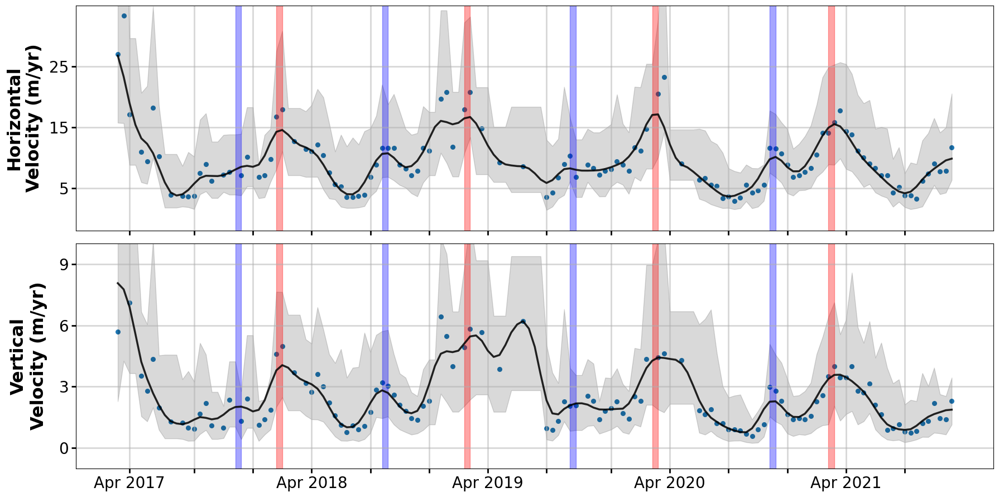

In [27]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
date_plot_maj = date_plot.copy()
date_plot_maj = [date_plot[n] if n%3==0 else '' for n in range(len(date_plot))]
# date_plot_maj[::3] = date_plot[::3]
V_mavg, V_m25tile, V_m75tile = create_series(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_series(Vh)
V_mavg2, Vh_mavg2 = remove_duplitcate(V_mavg, Vh_mavg)

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")
summer_spd = [28, 60, 92, 122]
winter_spd = [21, 46, 78, 112]

fig, ax = plt.subplots(2, figsize=(18, 9), gridspec_kw={'height_ratios': [1, 1]})

# color='#FF8700' , color='black', alpha=0.5
ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2.5, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg2, s=30)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[0].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[0].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[0].set_xticks(date_idx, [])
ax[0].set_yticks(np.arange(-5, 35, 10), np.arange(-5, 35, 10), fontsize=20)
ax[0].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[0].set_ylim(-2, 35)
ax[0].grid(linewidth=2)
ax[0].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# ax[0].tick_params(axis='both', which='minor', pad=15)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

ax[1].plot(range(len(Vh_mavg)), Vh_mavg_ga, '-', color='black', linewidth=2.5, alpha=0.85)
ax[1].scatter(range(len(Vh_mavg)), Vh_mavg2, s=30)
ax[1].fill_between(range(len(Vh_mavg)), Vh_m75tile, Vh_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[1].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[1].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[1].set_xticks(date_idx, date_plot_maj, fontsize=20)
ax[1].set_yticks(np.arange(0, 12, 3), np.arange(0, 12, 3), fontsize=20)
ax[1].set_ylabel("Vertical\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
ax[1].set_ylim(-1, 10)
ax[1].grid(linewidth=2)
ax[1].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)

fig.tight_layout()
plt.savefig('/DATA/Plots/ts_plot_g1.png')
plt.show()

### Glacier 2

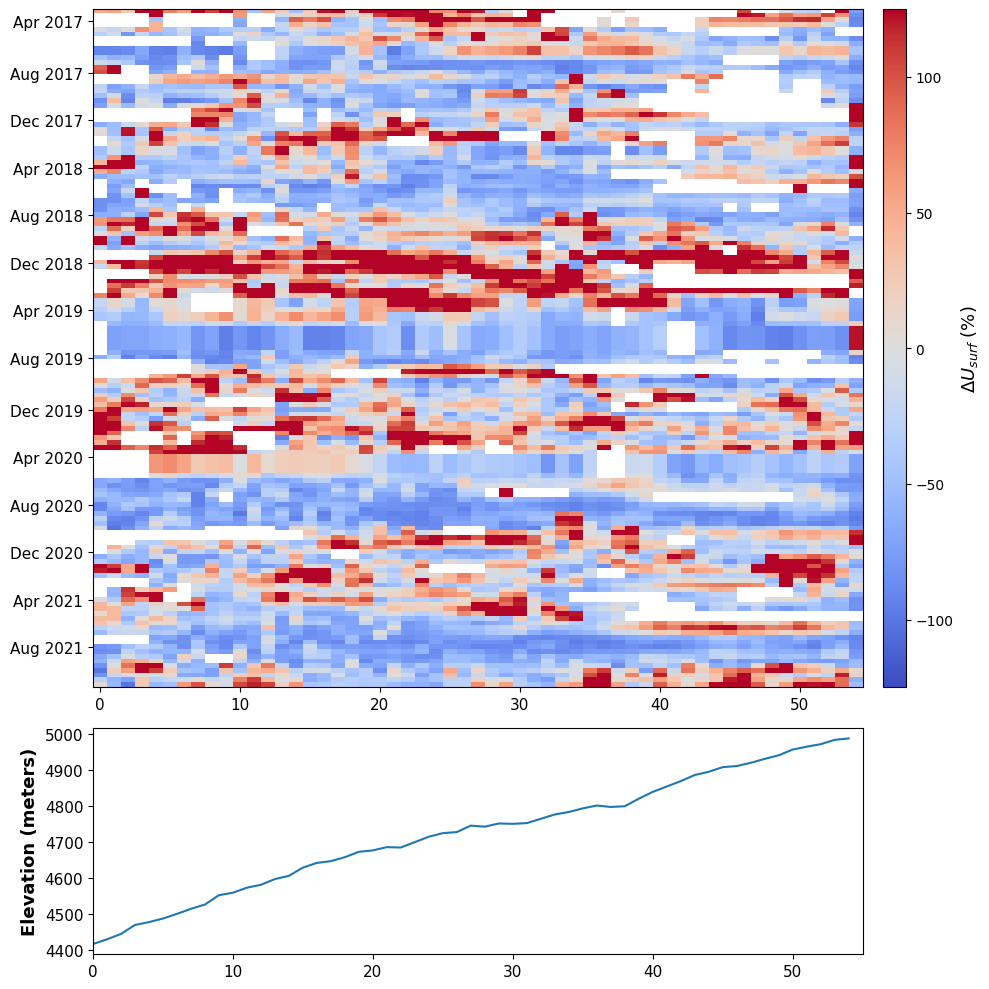

In [43]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V.shape[1], 0, V.shape[0]]
V[np.isnan(V)] = 0
# im = ax[0].imshow(V[:], vmin=0, vmax=80, cmap='turbo', aspect='auto')
im = ax[0].imshow(V_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{surf}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, V.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
plt.show()

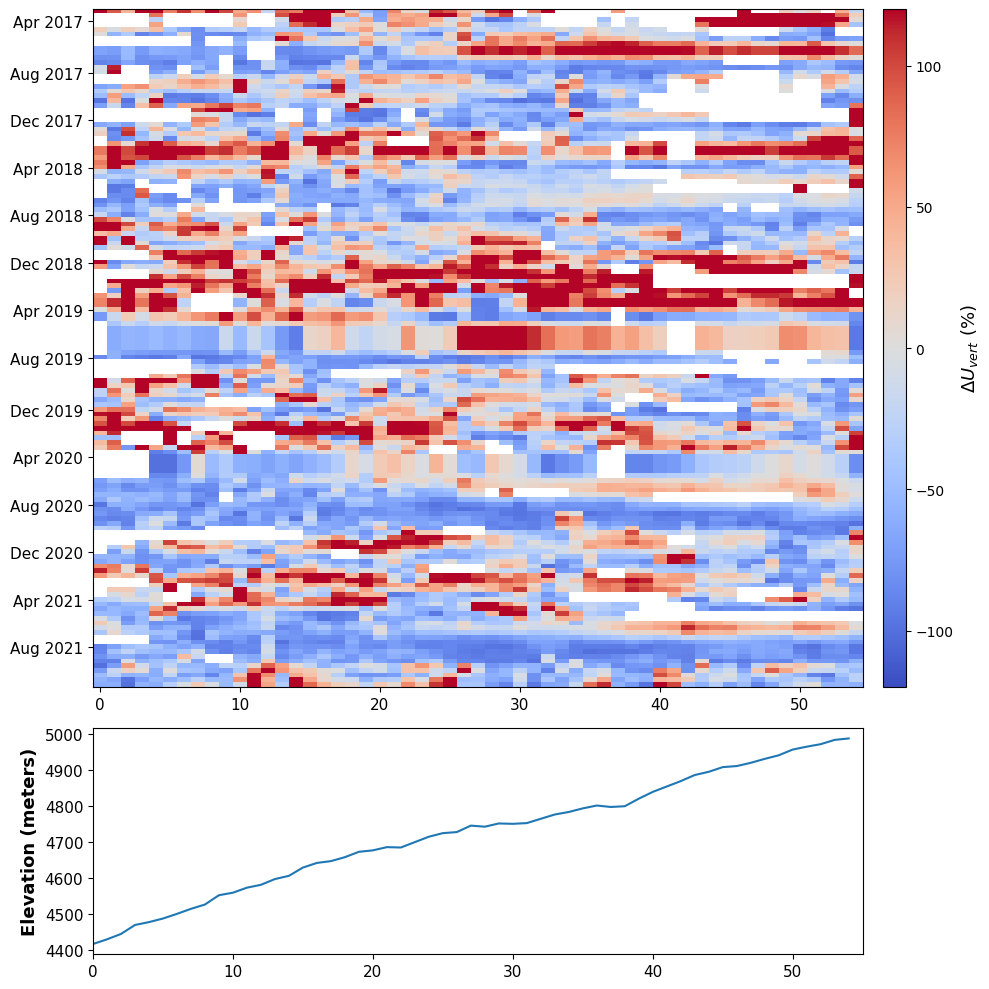

In [44]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, Vh.shape[1], 0, Vh.shape[0]]
Vh[np.isnan(Vh)] = 0
# im = ax[0].imshow(Vh[:], vmin=0, vmax=30, cmap='turbo', aspect='auto')
im = ax[0].imshow(Vh_perc2[:], vmin=-120, vmax=120, cmap='coolwarm', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{vert}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, Vh.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
plt.show()

/tmp/ipykernel_10550/2295561862.py:15: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_10550/2295561862.py:16: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


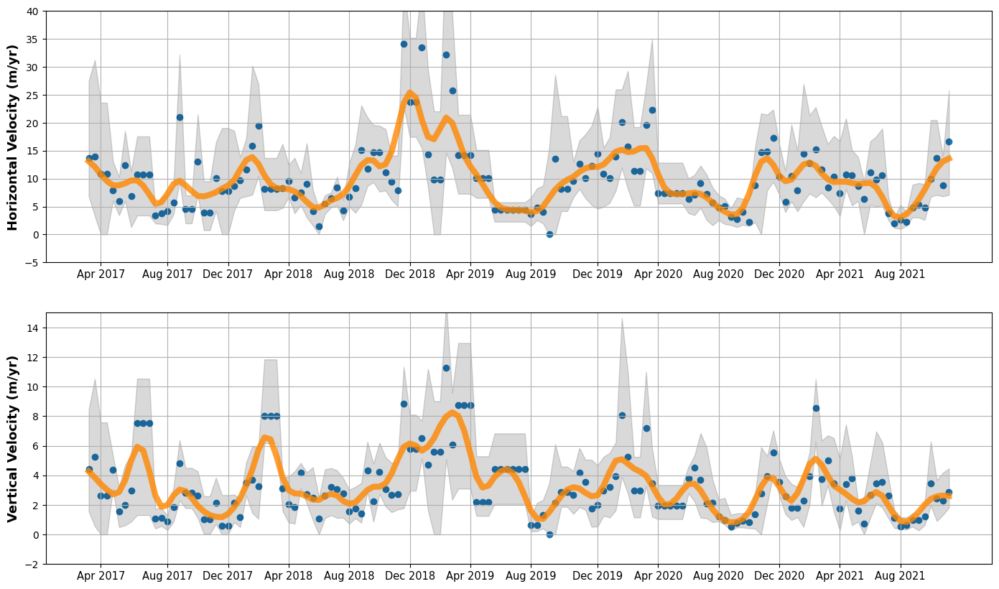

In [46]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
V_mavg, V_m25tile, V_m75tile = create_series(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_series(Vh)

# poly = []
# for i in range(len(itr)-1):
#     poly.append(np.poly1d(np.polyfit(range(len(V_mavg[itr[i]:itr[i+1]])), V_mavg[itr[i]:itr[i+1]], 1)))

# polyh = []
# for i in range(len(itr)-1):
    # polyh.append(np.poly1d(np.polyfit(range(len(Vh_mavg[itr[i]:itr[i+1]])), Vh_mavg[itr[i]:itr[i+1]], 1)))

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")

fig, ax = plt.subplots(2, figsize=(17, 10), gridspec_kw={'height_ratios': [1, 1]})

ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.8)
ax[0].scatter(range(len(V_mavg)), V_mavg)
# ax[0].set_xticks(range(len(date_ml))[0::10], date_ml[0::10], fontsize=11)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
# for i in range(len(itr)-1):
#     ax[0].plot(range(itr[i],itr[i+1]), poly[i](range(len(V_mavg[itr[i]:itr[i+1]]))), '-', color='#00C5B0', alpha=0.7)
ax[0].set_xticks(date_idx, date_plot, fontsize=10.5)
ax[0].set_ylabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[0].set_ylim(-5, 40)
ax[0].grid()

ax[1].plot(range(len(V_mavg)), Vh_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.8)
ax[1].scatter(range(len(Vh_mavg)), Vh_mavg)
ax[1].fill_between(range(len(Vh_mavg)), Vh_m75tile, Vh_m25tile, alpha=0.15, color='black', label="25th to 75th %")
# for i in range(len(itr)-1):
#     ax[1].plot(range(itr[i],itr[i+1]), polyh[i](range(len(Vh_mavg[itr[i]:itr[i+1]]))), '-', color='#00C5B0', alpha=0.7)
# ax[1].set_xticks(range(len(date_ml))[0::10], date_ml[0::10], fontsize=11)
ax[1].set_xticks(date_idx, date_plot, fontsize=10.5)
ax[1].set_ylabel("Vertical Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[1].set_ylim(-2, 15)
ax[1].grid()

plt.show()

### Glacier 3

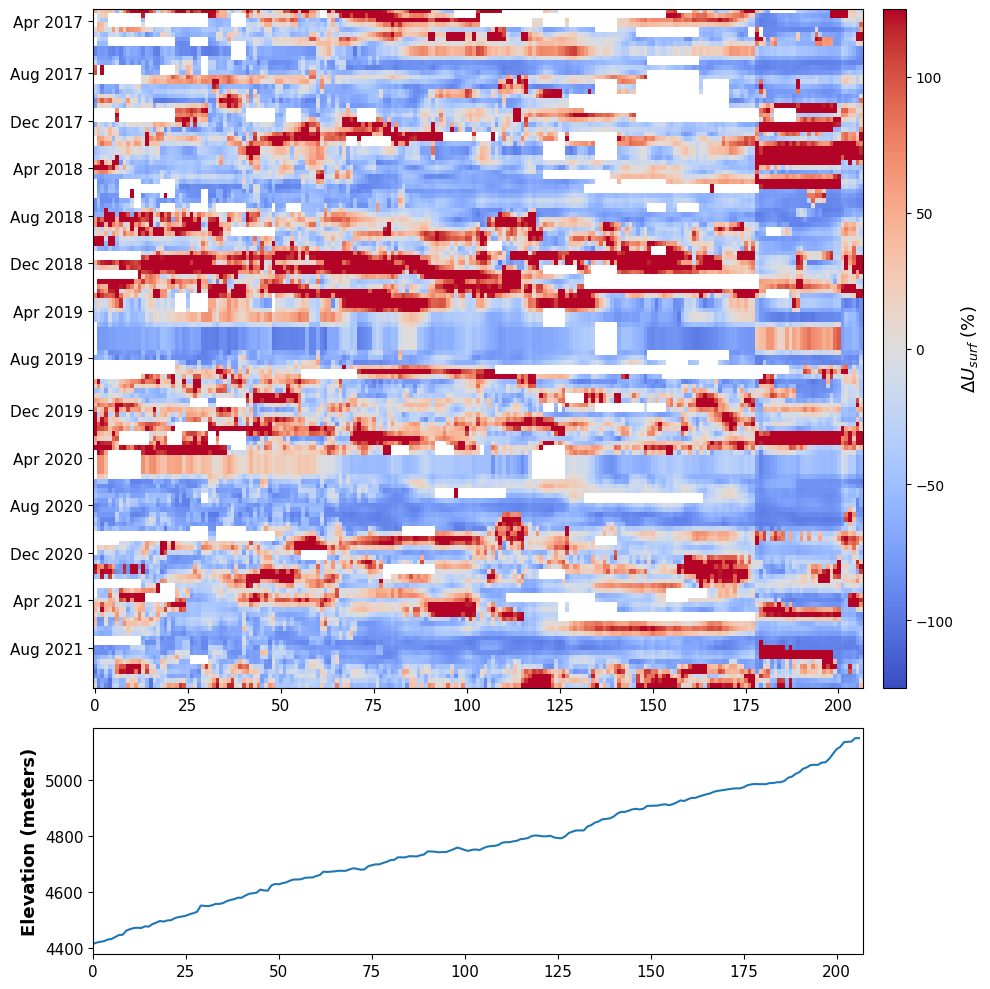

In [26]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V.shape[1], 0, V.shape[0]]
V[np.isnan(V)] = 0

im = ax[0].imshow(V_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
# im = ax[0].imshow(V[:], vmin=0, vmax=100, cmap='turbo', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{surf}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, V.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
plt.show()

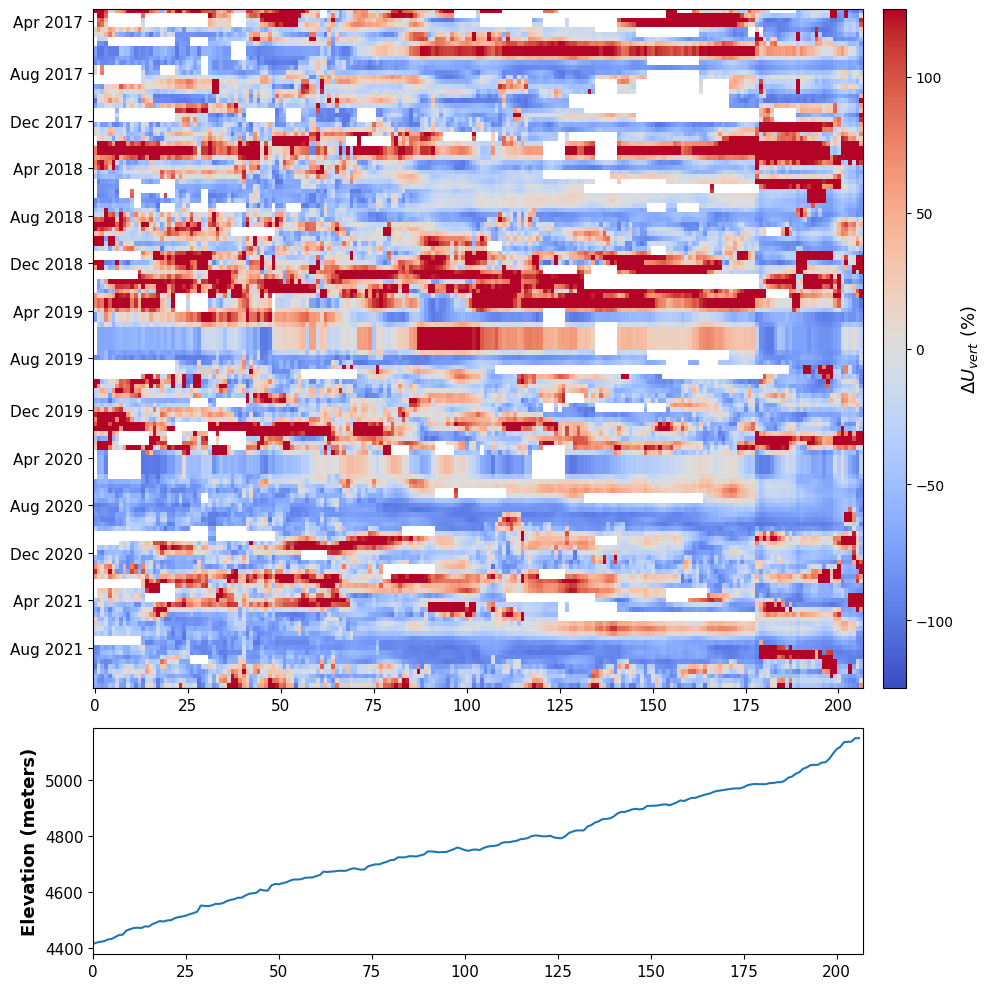

In [27]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, Vh.shape[1], 0, V.shape[0]]
V[np.isnan(V)] = 0

im = ax[0].imshow(Vh_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
# im = ax[0].imshow(Vh[:], vmin=0, vmax=40, cmap='turbo', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{vert}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, Vh.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
# plt.suptitle("Vertical Flow")
plt.show()

In [28]:
b = gaussian(6, 2.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")

/tmp/ipykernel_10550/1607096071.py:2: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_10550/1607096071.py:3: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


/tmp/ipykernel_10550/244998344.py:7: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_10550/244998344.py:8: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


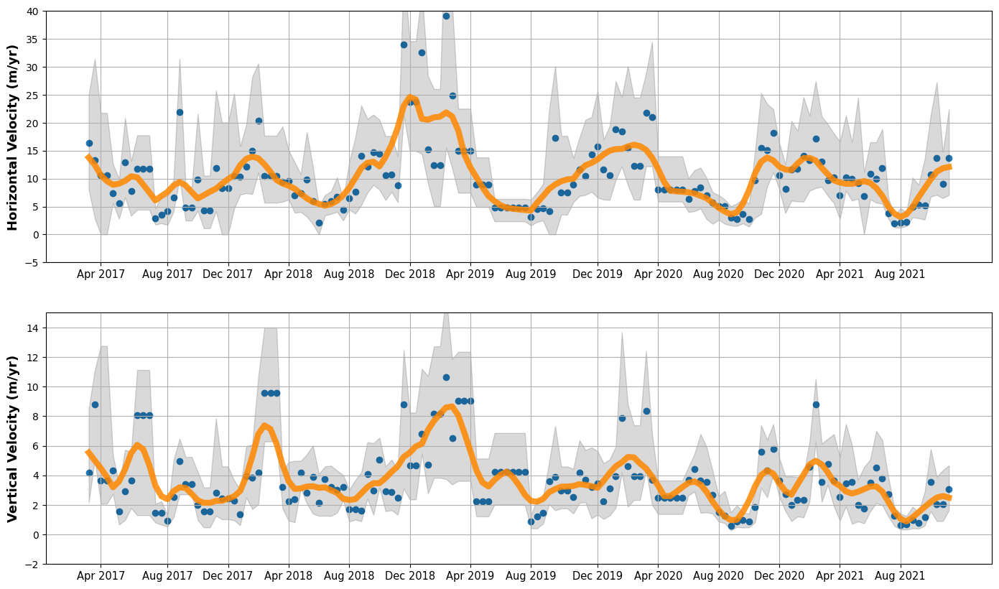

In [30]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
V_mavg, V_m25tile, V_m75tile = create_series(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_series(Vh)

b = gaussian(6, 2)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")

fig, ax = plt.subplots(2, figsize=(17, 10), gridspec_kw={'height_ratios': [1, 1]})

ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
ax[0].set_xticks(date_idx, date_plot, fontsize=10.5)
# ax[0].set_xticks(range(len(date_ml))[2::12], date_ml[2::12], fontsize=11)
ax[0].set_ylabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[0].set_ylim(-5, 40)
ax[0].grid()

ax[1].plot(range(len(Vh_mavg)), Vh_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.85)
ax[1].scatter(range(len(Vh_mavg)), Vh_mavg)
ax[1].fill_between(range(len(Vh_mavg)), Vh_m75tile, Vh_m25tile, alpha=0.15, color='black', label="25th to 75th %")
ax[1].set_xticks(date_idx, date_plot, fontsize=10.5)
# ax[1].set_xticks(range(len(date_ml))[2::12], date_ml[2::12], fontsize=11)
ax[1].set_ylabel("Vertical Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[1].set_ylim(-2, 15)
ax[1].grid()

plt.show()

### Glacier 4

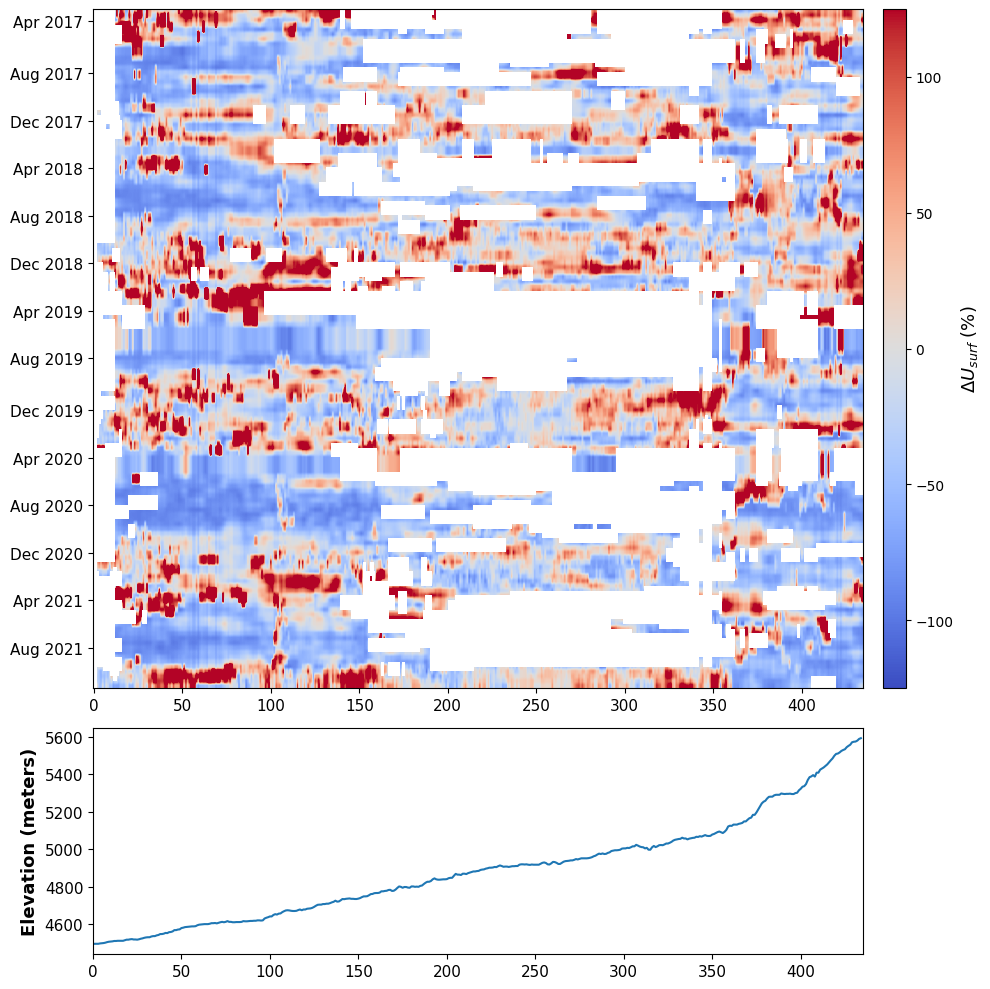

In [36]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V.shape[1], 0, V.shape[0]]
V[np.isnan(V)] = 0

im = ax[0].imshow(V_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
# im = ax[0].imshow(V[:], vmin=0, vmax=100, cmap='turbo', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{surf}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, V.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
plt.show()

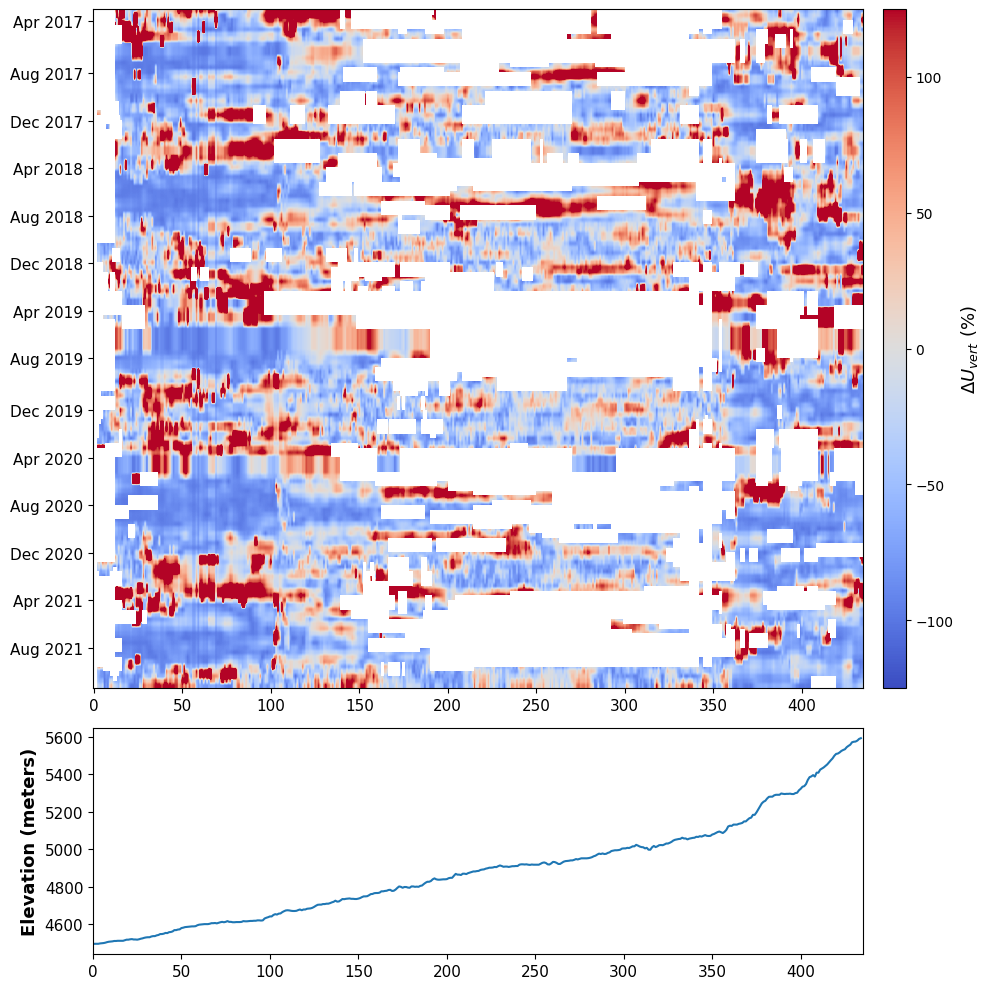

In [37]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, Vh.shape[1], 0, V.shape[0]]
V[np.isnan(V)] = 0

im = ax[0].imshow(Vh_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
# im = ax[0].imshow(Vh[:], vmin=0, vmax=40, cmap='turbo', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{vert}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, Vh.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
# plt.suptitle("Vertical Flow")
plt.show()

/tmp/ipykernel_10550/1398441638.py:7: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_10550/1398441638.py:8: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


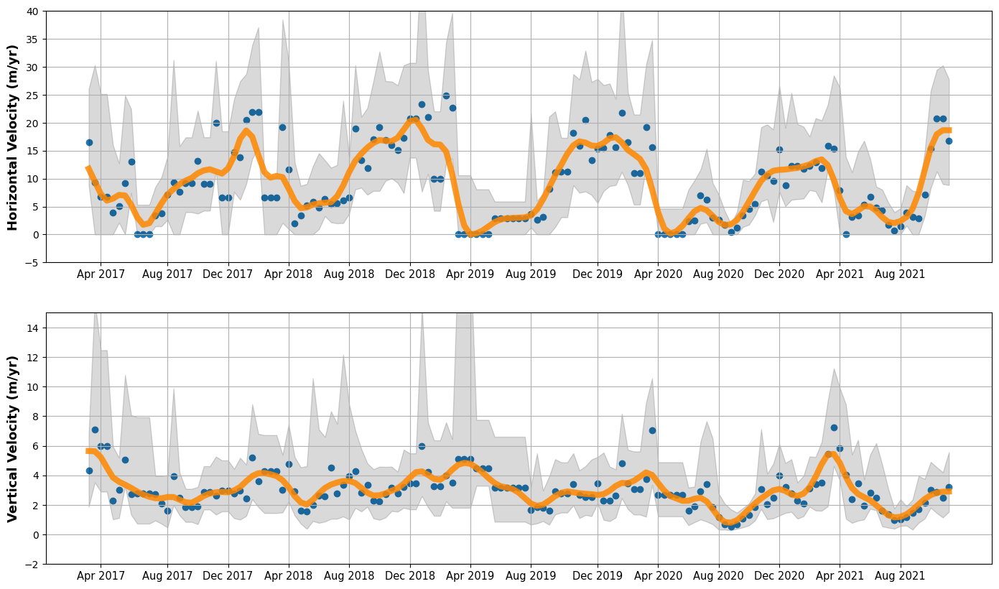

In [39]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
V_mavg, V_m25tile, V_m75tile = create_series(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_series(Vh)

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")

fig, ax = plt.subplots(2, figsize=(17, 10), gridspec_kw={'height_ratios': [1, 1]})

ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
ax[0].set_xticks(date_idx, date_plot, fontsize=10.5)
ax[0].set_ylabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[0].set_ylim(-5, 40)
ax[0].grid()

ax[1].plot(range(len(Vh_mavg)), Vh_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.85)
ax[1].scatter(range(len(Vh_mavg)), Vh_mavg)
ax[1].fill_between(range(len(Vh_mavg)), Vh_m75tile, Vh_m25tile, alpha=0.15, color='black', label="25th to 75th %")
ax[1].set_xticks(date_idx, date_plot, fontsize=10.5)
ax[1].set_ylabel("Vertical Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[1].set_ylim(-2, 15)
ax[1].grid()

plt.show()

/tmp/ipykernel_180542/1302067066.py:11: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_180542/1302067066.py:12: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


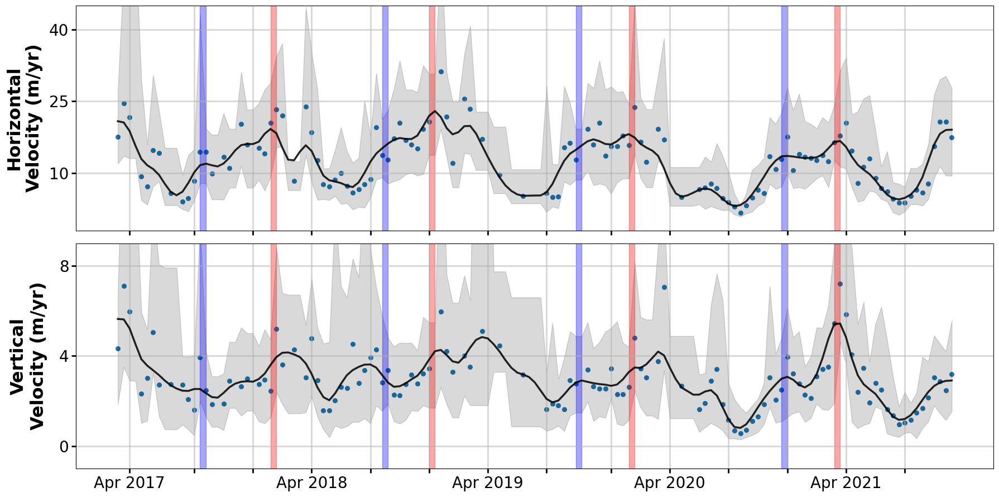

In [67]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
date_plot_maj = date_plot.copy()
date_plot_maj = [date_plot[n] if n%3==0 else '' for n in range(len(date_plot))]
# date_plot_maj[::3] = date_plot[::3]
V_mavg, V_m25tile, V_m75tile = create_series(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_series(Vh)
V_mavg2, Vh_mavg2 = remove_duplitcate(V_mavg, Vh_mavg)

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")
summer_spd = [27, 54, 88, 123]
winter_spd = [15, 46, 79, 114]

fig, ax = plt.subplots(2, figsize=(18, 9), gridspec_kw={'height_ratios': [1, 1]})

# color='#FF8700' , color='black', alpha=0.5
ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2.5, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg2, s=30)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[0].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[0].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[0].set_xticks(date_idx, [])
ax[0].set_yticks(np.arange(-5, 45, 15), np.arange(-5, 45, 15), fontsize=20)
ax[0].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[0].set_ylim(-2, 45)
ax[0].grid(linewidth=2)
ax[0].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

ax[1].plot(range(len(Vh_mavg)), Vh_mavg_ga, '-', color='black', linewidth=2.5, alpha=0.85)
ax[1].scatter(range(len(Vh_mavg)), Vh_mavg2, s=30)
ax[1].fill_between(range(len(Vh_mavg)), Vh_m75tile, Vh_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[1].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[1].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[1].set_xticks(date_idx, date_plot_maj, fontsize=20)
ax[1].set_yticks(np.arange(0, 10, 4), np.arange(0, 10, 4), fontsize=20)
ax[1].set_ylabel("Vertical\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=15)
ax[1].set_ylim(-1, 9)
ax[1].grid(linewidth=2)
ax[1].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)

fig.tight_layout()

plt.savefig('/DATA/Plots/ts_plot_g4.png')
plt.show()


### Glacier 5

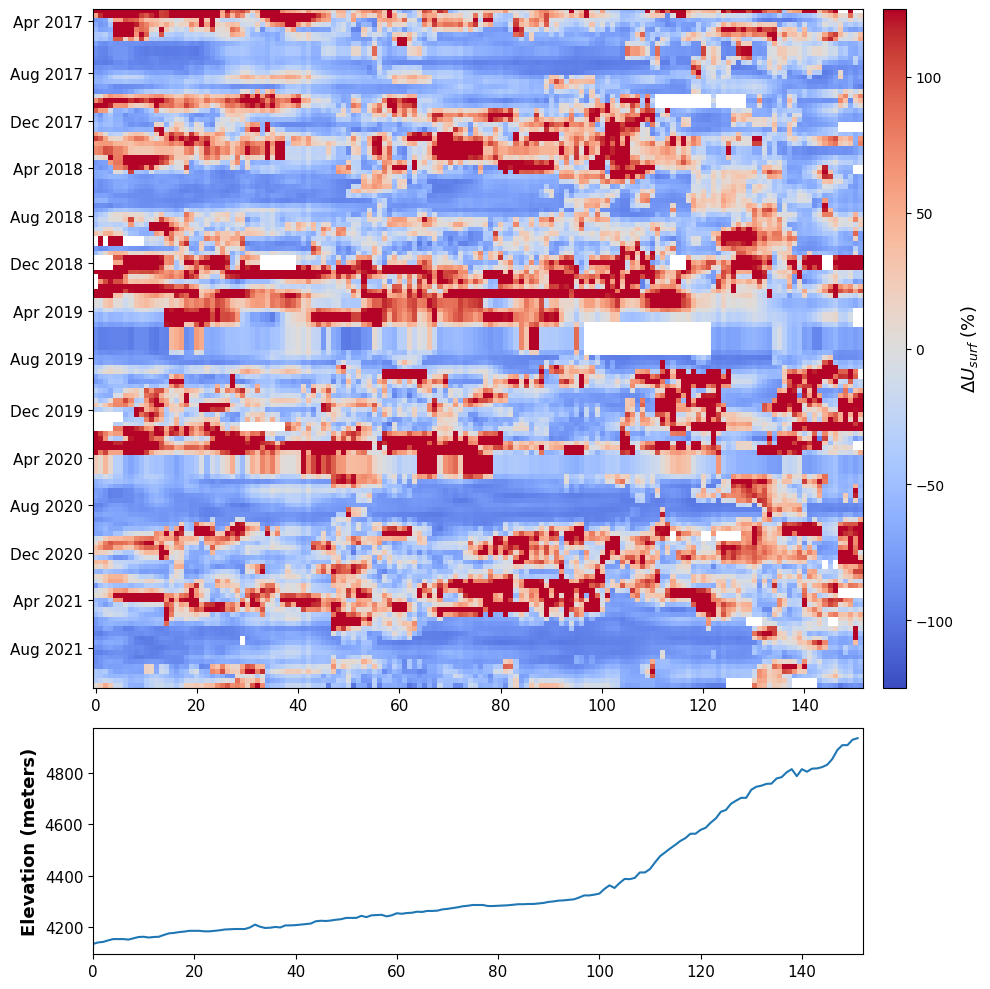

In [20]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, V.shape[1], 0, V.shape[0]]
V[np.isnan(V)] = 0

im = ax[0].imshow(V_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
# im = ax[0].imshow(V[:], vmin=0, vmax=100, cmap='turbo', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{surf}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, V.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
plt.show()

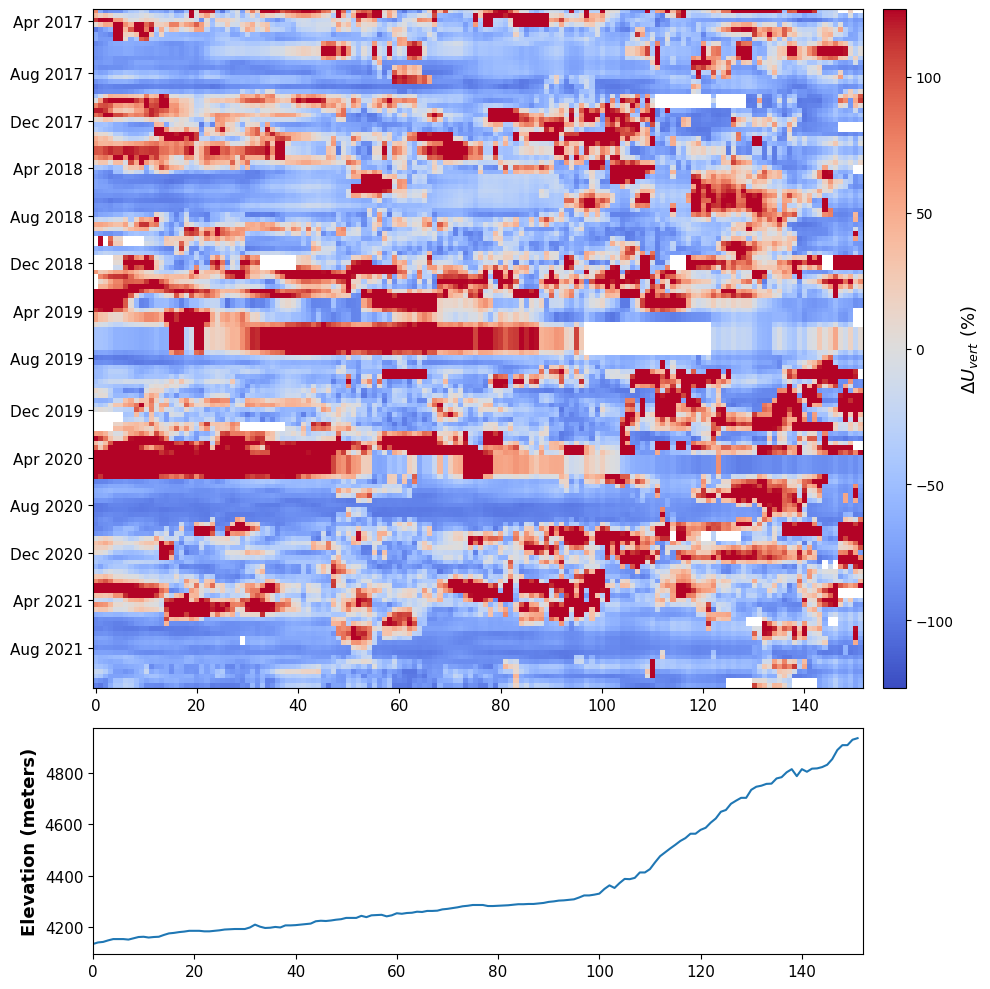

In [21]:
fig, ax = plt.subplots(2, figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})
# plt.subplots_adjust(wspace=0.001)
extent = [0, Vh.shape[1], 0, V.shape[0]]
V[np.isnan(V)] = 0

im = ax[0].imshow(Vh_perc2[:], vmin=-125, vmax=125, cmap='coolwarm', aspect='auto')
# im = ax[0].imshow(Vh[:], vmin=0, vmax=40, cmap='turbo', aspect='auto')
# ax[0].set_yticks(range(len(date_ml))[::8], date_ml[::8], fontsize=11)
ax[0].set_yticks(date_idx, date_plot, fontsize=11)
ax[0].xaxis.set_tick_params(labelsize=11)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="3%", pad=.2)
cbar = fig.colorbar(im, orientation='vertical', ax=ax[0], cax=cax)
cbar.set_label('$ΔU_{vert}$ (%)', fontsize=13)

ax[1].plot(dem)
ax[1].set_xlim(0, Vh.shape[1])
ax[1].xaxis.set_tick_params(labelsize=11)
ax[1].yaxis.set_tick_params(labelsize=11)
ax[1].set_ylabel("Elevation (meters)", fontweight='bold', fontsize=13)
divider2 = make_axes_locatable(ax[1])
cax2 = divider2.append_axes("right", size="3%", pad=.2)
cax2.remove()
plt.tight_layout()
# plt.suptitle("Vertical Flow")
plt.show()

In [63]:
def remove_duplitcate(V_mavg, Vh_mavg):
    prev = -10000
    cnt = 0
    cnts = []
    V_mavg2 = V_mavg.copy()
    Vh_mavg2 = Vh_mavg.copy()
    for i in range(len(V_mavg)):
        # print(V_mavg[i])
        if V_mavg[i]==prev:
            cnt+=1
        else:
            cnts.append(cnt)
            if cnt>1:
                # print(cnt, V_mavg2[i-cnt:i], i, i-(cnt//2))
                V_mavg2[i-cnt:i] = np.nan
                V_mavg2[i-(cnt//2)-1] = V_mavg[i-1]
                Vh_mavg2[i-cnt:i] = np.nan
                Vh_mavg2[i-(cnt//2)-1] = Vh_mavg[i-1]
                
            # print("dfd")
            prev = V_mavg[i]
            cnt=1

    return V_mavg2, Vh_mavg2

/tmp/ipykernel_180542/3735197441.py:11: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_180542/3735197441.py:12: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


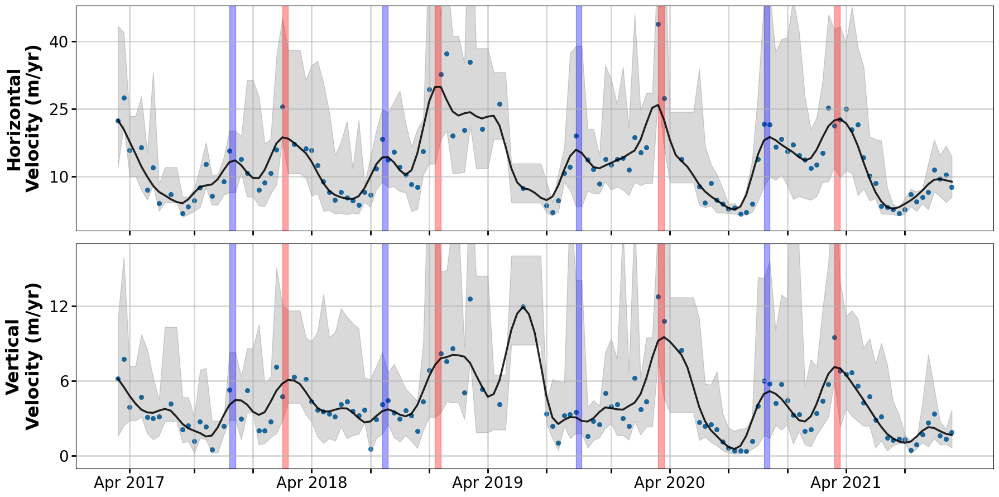

In [55]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
date_plot_maj = date_plot.copy()
date_plot_maj = [date_plot[n] if n%3==0 else '' for n in range(len(date_plot))]
# date_plot_maj[::3] = date_plot[::3]
V_mavg, V_m25tile, V_m75tile = create_series(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_series(Vh)
V_mavg2, Vh_mavg2 = remove_duplitcate(V_mavg, Vh_mavg)

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")

fig, ax = plt.subplots(2, figsize=(18, 9), gridspec_kw={'height_ratios': [1, 1]})
summer_spd = [29, 55, 93, 123]
winter_spd = [20, 46, 79, 111]

# color='#FF8700' , color='black', alpha=0.5
ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='black', linewidth=2.5, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg2, s=30)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[0].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[0].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[0].set_xticks(date_idx, [])
ax[0].set_yticks(np.arange(-5, 50, 15), np.arange(-5, 50, 15), fontsize=20)
# ax[0].set_ylabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=20)
ax[0].set_ylabel("Horizontal\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[0].set_ylim(-2, 48)
ax[0].grid(linewidth=2)
ax[0].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)
# for tic in ax[0].xaxis.get_major_ticks():
#     tic.tick1On = tic.tick2On = False

ax[1].plot(range(len(Vh_mavg)), Vh_mavg_ga, '-', color='black', linewidth=2.5, alpha=0.85)
ax[1].scatter(range(len(Vh_mavg)), Vh_mavg2, s=30)
ax[1].fill_between(range(len(Vh_mavg)), Vh_m75tile, Vh_m25tile, alpha=0.15, color='black', label="25th to 75th %")
for li in range(len(summer_spd)):
    ax[1].fill_between(range(summer_spd[li]-1,summer_spd[li]+1), -2, 48, alpha=0.35, color='red')
for li in range(len(winter_spd)):
    ax[1].fill_between(range(winter_spd[li]-1,winter_spd[li]+1), -2, 48, alpha=0.35, color='blue')
    
ax[1].set_xticks(date_idx, date_plot_maj, fontsize=20)
ax[1].set_yticks(np.arange(0, 18, 6), np.arange(0, 18, 6), fontsize=20)
ax[1].set_ylabel("Vertical\nVelocity (m/yr)", fontweight='bold', fontsize=23, labelpad=8)
ax[1].set_ylim(-1, 17)
ax[1].grid(linewidth=2)
ax[1].tick_params(direction='out', length=6, width=2, grid_alpha=0.5)

fig.tight_layout()

plt.savefig('/DATA/Plots/ts_plot_g5.png')
plt.show()

In [98]:
for i, d in enumerate(sorted(list(date_m))):
    print(i, d)

0 2019/01/09
1 2019/01/21
2 2019/02/02
3 2019/02/26
4 2019/03/10
5 2019/03/22
6 2019/04/27
7 2019/06/02
8 2019/08/13
9 2019/08/25
10 2019/09/06
11 2019/09/18
12 2019/09/30
13 2019/10/12
14 2019/11/05
15 2019/11/17
16 2019/11/29
17 2019/12/11
18 2019/12/23
19 2020/01/04
20 2020/01/16
21 2020/01/28
22 2020/02/09
23 2020/02/21
24 2020/03/04
25 2020/03/28
26 2020/04/09
27 2020/04/21
28 2020/06/20
29 2020/07/02
30 2020/07/14
31 2020/07/26
32 2020/08/07
33 2020/08/19
34 2020/08/31
35 2020/09/12
36 2020/09/24
37 2020/10/06
38 2020/10/18
39 2020/10/30
40 2020/11/11
41 2020/11/23
42 2020/12/05
43 2020/12/17
44 2020/12/29
45 2021/01/10
46 2021/01/22
47 2021/02/03
48 2021/02/15
49 2021/02/27
50 2021/03/11
51 2021/03/23
52 2021/04/04
53 2021/04/16
54 2021/04/28
55 2021/05/10
56 2021/05/22
57 2021/06/03
58 2021/06/15
59 2021/06/27
60 2021/07/09
61 2021/07/21
62 2021/08/02
63 2021/08/14
64 2021/08/26
65 2021/09/07
66 2021/09/19
67 2021/10/01
68 2021/10/13
69 2021/10/25
70 2021/11/06
71 2021/11/18
72

/tmp/ipykernel_3918931/382339366.py:7: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
/tmp/ipykernel_3918931/382339366.py:8: DeprecationWarning: Please use `convolve1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")


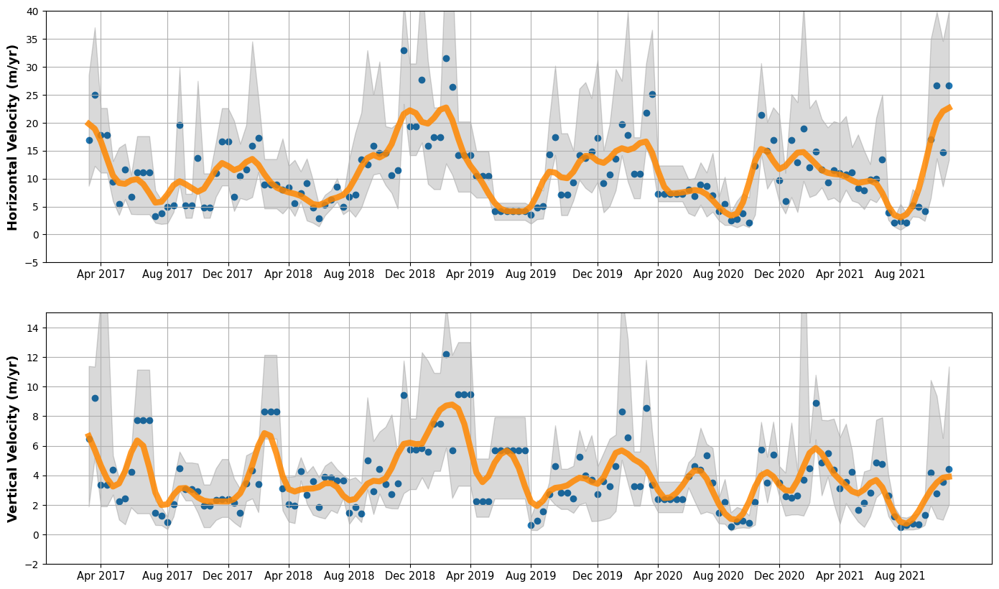

In [70]:
# V_mavg = create_series(V)
# Vh_mavg = create_series(Vh)
V_mavg, V_m25tile, V_m75tile = create_series(V)
Vh_mavg, Vh_m25tile, Vh_m75tile = create_series(Vh)

b = gaussian(6, 1.5)
V_mavg_ga = filters.convolve1d(V_mavg, b / b.sum(), mode="reflect")
Vh_mavg_ga = filters.convolve1d(Vh_mavg, b / b.sum(), mode="reflect")

fig, ax = plt.subplots(2, figsize=(17, 10), gridspec_kw={'height_ratios': [1, 1]})

ax[0].plot(range(len(V_mavg)), V_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.85)
ax[0].scatter(range(len(V_mavg)), V_mavg)
ax[0].fill_between(range(len(V_mavg)), V_m75tile, V_m25tile, alpha=0.15, color='black', label="25th to 75th %")
ax[0].set_xticks(date_idx, date_plot, fontsize=10.5)
# ax[0].set_xticks(range(len(date_ml))[2::12], date_ml[2::12], fontsize=11)
ax[0].set_ylabel("Horizontal Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[0].set_ylim(-5, 40)
ax[0].grid()

ax[1].plot(range(len(Vh_mavg)), Vh_mavg_ga, '-', color='#FF8700', linewidth=6, alpha=0.85)
ax[1].scatter(range(len(Vh_mavg)), Vh_mavg)
ax[1].fill_between(range(len(Vh_mavg)), Vh_m75tile, Vh_m25tile, alpha=0.15, color='black', label="25th to 75th %")
ax[1].set_xticks(date_idx, date_plot, fontsize=10.5)
# ax[1].set_xticks(range(len(date_ml))[2::12], date_ml[2::12], fontsize=11)
ax[1].set_ylabel("Vertical Velocity (m/yr)", fontweight='bold', fontsize=13)
ax[1].set_ylim(-2, 15)
ax[1].grid()

plt.show()